# Logistic regression with R: `brms`, `rstanarm`, `bayesplot`, and `loo`

This workshop's goal—which is facilitated by this notebook—is to give attendees the confidence to conduct Bayesian regression analyses with `R` for their research projects.

[`brms`](https://paul-buerkner.github.io/brms/index.html) provides an interface to fit Bayesian generalized (non-)linear multivariate multilevel models using `Stan`.  The formula syntax is very similar to that of the package `lme4` to provide a familiar and simple interface for performing regression analyses.

[`rstanarm`](https://mc-stan.org/rstanarm/index.html) emulates other `R` model-fitting functions but uses `Stan` for the back-end estimation.  The primary target audience is people who would be open to Bayesian inference if using Bayesian software were easier but would use frequentist software otherwise.

[`bayesplot`](https://mc-stan.org/bayesplot/index.html) provides an extensive library of plotting functions for use after fitting Bayesian models (typically with MCMC).

[`loo`](https://mc-stan.org/loo/index.html) allows users to compute efficient approximate leave-one-out cross-validation for fitted Bayesian models, as well as model weights that can be used to average predictive distributions.

To motivate this workshop, we'll work with examples from [Regression and Other Stories](https://avehtari.github.io/ROS-Examples/examples.html) and go through the various steps of conducting regression analyses in a [Bayesian workflow](https://arxiv.org/abs/2011.01808). Hopefully, you will come away feeling confident you can use R to conduct regression analyses for your research projects.

# Table of Contents

## Logistic regression with [`rstanarm`](https://mc-stan.org/rstanarm/index.html) or [`brms`](https://paul-buerkner.github.io/brms/index.html)

- ### An intercept

- ### A binary predictor

- ### A continuous predictor

- ### Two predictors (no interaction)

- ### Model comparison

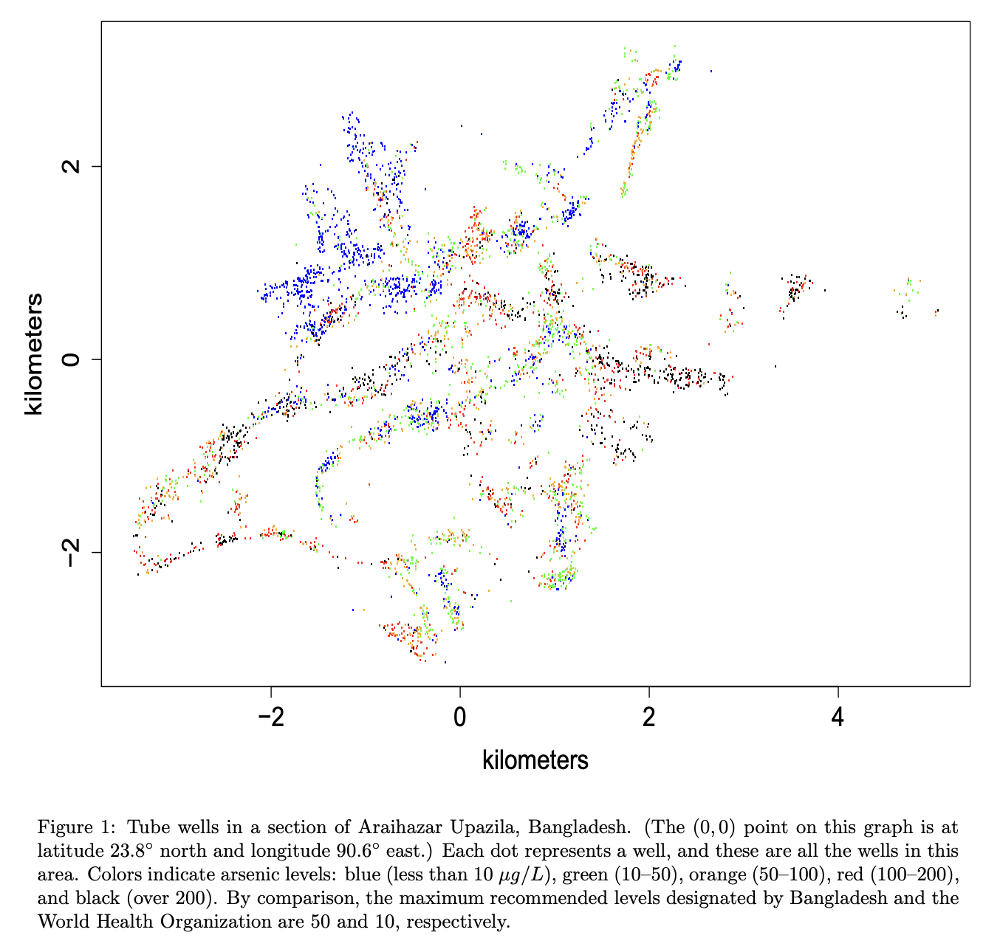

---

## Load packages

In [ ]:
if (!require("pacman")) install.packages("pacman")
pacman::p_load("tidyverse",
               "brms",
               "bayesplot",
               "loo",
               "marginaleffects",
               "MASS",
               "modelr",
               "patchwork",
               "rstanarm",
               "tidybayes")

## Visualization in Bayesian workflow
- Plot data
- Plot model
- Plot prior parameter distributions
- Plot prior predictive distributions
- Plot MCMC diagnostics
- Plot posterior parameter distributions
- Plot posterior predictive distributions
- Plot model comparisons

## Load Data into DataFrame

The data used in these examples is available in the following [GitHub repository](https://github.com/avehtari/ROS-Examples/tree/master). For this example, we're working with the `wells` dataset from [Regression and Other Stories](https://avehtari.github.io/ROS-Examples/examples.html).

In [ ]:
wells <- read_csv('https://raw.githubusercontent.com/avehtari/ROS-Examples/master/Arsenic/data/wells.csv')
glimpse(wells)

Rows: 3020 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (7): switch, arsenic, dist, dist100, assoc, educ, educ4

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Rows: 3,020
Columns: 7
$ switch  <dbl> 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,…
$ arsenic <dbl> 2.36, 0.71, 2.07, 1.15, 1.10, 3.90, 2.97, 3.24, 3.28, 2.52, 3.…
$ dist    <dbl> 16.826, 47.322, 20.967, 21.486, 40.874, 69.518, 80.711, 55.146…
$ dist100 <dbl> 0.16826, 0.47322, 0.20967, 0.21486, 0.40874, 0.69518, 0.80711,…
$ assoc   <dbl> 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,…
$ educ    <dbl> 0, 0, 10, 12, 14, 9, 4, 10, 0, 0, 5, 0, 0, 0, 0, 7, 7, 7, 0, 1…
$ educ4   <dbl> 0.00, 0.00, 2.50, 3.00, 3.50, 2.25, 1.00, 2.50, 0.00, 0.00, 1.…


## Explore Data

In [ ]:
# sapply(wells, function(x) sum(is.na(x)))

# colSums(is.na(wells))

wells %>%
  summarise_all(~sum(is.na(.)))

switch,arsenic,dist,dist100,assoc,educ,educ4
<int>,<int>,<int>,<int>,<int>,<int>,<int>
0,0,0,0,0,0,0


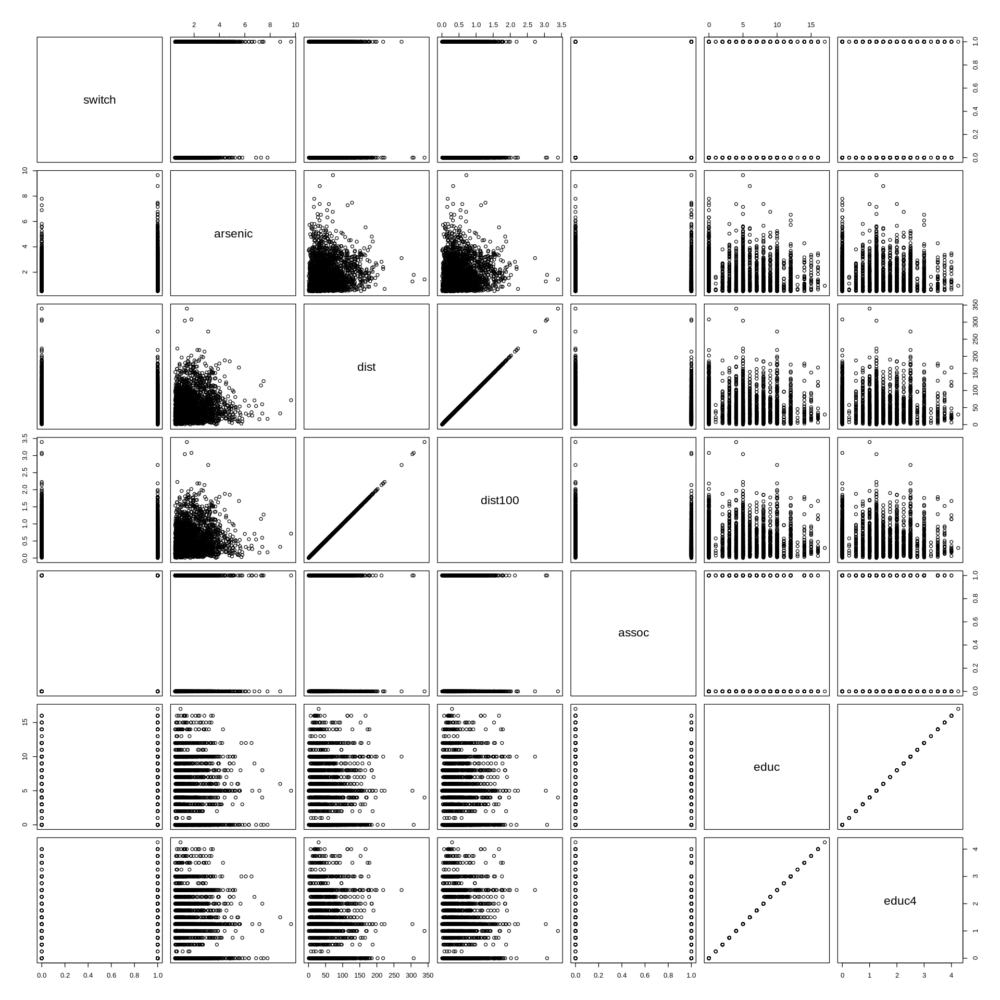

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 16)
pairs(wells)

In [ ]:
summary(wells)

     switch          arsenic           dist            dist100       
 Min.   :0.0000   Min.   :0.510   Min.   :  0.387   Min.   :0.00387  
 1st Qu.:0.0000   1st Qu.:0.820   1st Qu.: 21.117   1st Qu.:0.21117  
 Median :1.0000   Median :1.300   Median : 36.761   Median :0.36762  
 Mean   :0.5752   Mean   :1.657   Mean   : 48.332   Mean   :0.48332  
 3rd Qu.:1.0000   3rd Qu.:2.200   3rd Qu.: 64.041   3rd Qu.:0.64041  
 Max.   :1.0000   Max.   :9.650   Max.   :339.531   Max.   :3.39531  
     assoc             educ            educ4      
 Min.   :0.0000   Min.   : 0.000   Min.   :0.000  
 1st Qu.:0.0000   1st Qu.: 0.000   1st Qu.:0.000  
 Median :0.0000   Median : 5.000   Median :1.250  
 Mean   :0.4228   Mean   : 4.828   Mean   :1.207  
 3rd Qu.:1.0000   3rd Qu.: 8.000   3rd Qu.:2.000  
 Max.   :1.0000   Max.   :17.000   Max.   :4.250  

---

# 1. An intercept (a column of 1s)

## Estimating a proportion is the same as regressing on a constant term

## Plot data

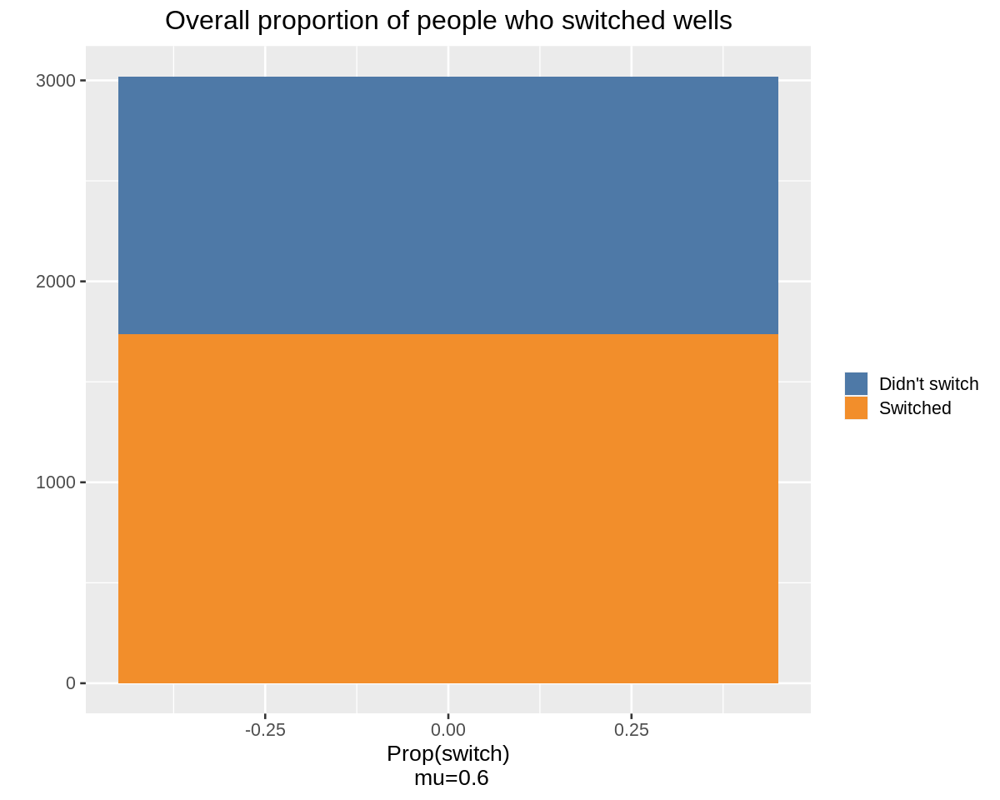

In [ ]:
# @title
options(repr.plot.width = 10, repr.plot.height = 8)

n_switched <- wells %>% dplyr::filter(switch == 1) %>% tally() %>% pull()
n_didnt_switch <- wells %>% dplyr::filter(switch == 0) %>% tally() %>% pull()

condition <- c("Didn't switch" , "Switched")
counts <- c(n_didnt_switch, n_switched)
data <- tibble(condition = condition, counts = counts)

p_switched = sprintf("Prop(switch)\n mu=%.1f", round(n_switched / (n_switched+n_didnt_switch), 1))

ggplot(data, aes(x = 0, y = counts, fill = condition)) +
    geom_col() +
    scale_color_manual(name = "",
                       values = c("#4E79A7", "#F28E2B"),
                       aesthetics = c("colour", "fill")) +
    labs(x = p_switched,
         y = "",
         title = "Overall proportion of people who switched wells") +
    theme_grey(base_size = 16) +
    theme(plot.title = element_text(hjust = 0.5))

In [ ]:
# Mean of switch (overall proportion of people who switched wells)
round(mean(wells$switch),1)

[1] 0.6

In [ ]:
# Standard deviation of switch
round(sd(wells$switch),1)

[1] 0.5

## Plot model

The printouts show that, in the model, `switch` is distributed as a [Bernoulli distribution](https://distribution-explorer.github.io/discrete/bernoulli.html), with a mean (`Intercept`) that is distributed as a [Student-t distribution](https://distribution-explorer.github.io/continuous/student_t.html).

In [ ]:
m1 <- brm(switch ~ 1,
          data = wells,
          family = bernoulli(link = "logit"),
          seed = 241348,
          refresh=0)

m1

Compiling Stan program...

Start sampling



 Family: bernoulli 
  Links: mu = logit 
Formula: switch ~ 1 
   Data: wells (Number of observations: 3020) 
  Draws: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup draws = 4000

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept     0.30      0.04     0.23     0.38 1.00     1470     2247

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

In [ ]:
prior_summary(m1)

prior,class,coef,group,resp,dpar,nlpar,lb,ub,source
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
"student_t(3, 0, 2.5)",Intercept,,,,,,,,default


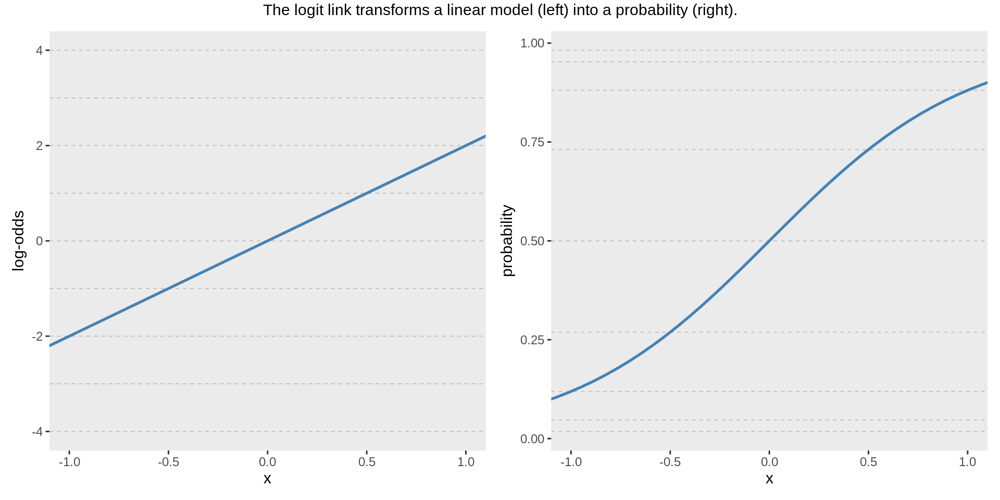

In [ ]:
# @title
# SOURCE: https://bookdown.org/content/4857/big-entropy-and-the-generalized-linear-model.html#linking-linear-models-to-distributions.

# first, we'll make data for the horizontal lines
alpha <- 0
beta  <- 4

lines <-
  tibble(x = seq(from = -1, to = 1, by = .25)) %>%
  mutate(`log-odds`  = alpha + x * beta,
         probability = exp(alpha + x * beta) / (1 + exp(alpha + x * beta)))

# now we're ready to make the primary data
beta  <- 2
d <-
  tibble(x = seq(from = -1.5, to = 1.5, length.out = 50)) %>%
  mutate(`log-odds`  = alpha + x * beta,
         probability = exp(alpha + x * beta) / (1 + exp(alpha + x * beta)))

# now we make the individual plots
p1 <-
  d %>%
  ggplot(aes(x = x, y = `log-odds`)) +
  geom_hline(data = lines,
             linetype='dashed',
             aes(yintercept = `log-odds`),
             color = "grey") +
  geom_line(linewidth = 1.5, color = "steelblue") +
  coord_cartesian(xlim = c(-1, 1)) +
  theme_grey(base_size = 18) +
  theme(panel.grid = element_blank())

p2 <-
  d %>%
  ggplot(aes(x = x, y = probability)) +
  geom_hline(data = lines,
             linetype='dashed',
             aes(yintercept = probability),
             color = "grey") +
  geom_line(linewidth = 1.5, color = "steelblue") +
  coord_cartesian(xlim = c(-1, 1)) +
  theme_grey(base_size = 18) +
  theme(panel.grid = element_blank())

options(repr.plot.width = 16, repr.plot.height = 8)
# finally, we're ready to mash the plots together and behold their nerdy glory
(p1 | p2) +
    plot_annotation(title = "The logit link transforms a linear model (left) into a probability (right).",
    theme = theme(plot.title = element_text(hjust = 0.5, size = 18)))

## Plot prior parameter distributions

[Prior Choice Recommendations](https://github.com/stan-dev/stan/wiki/Prior-Choice-Recommendations)

1. Flat prior (not usually recommended).

2. Super-vague but proper prior: normal(0, 1e6) (not usually recommended).

3. Weakly informative prior, very weak: normal(0, 10).

4. Generic weakly informative prior: normal(0, 1).

5. Specific informative prior: normal(0.4, 0.2) or whatever. Sometimes this can be expressed as a scaling followed by a generic prior: theta = 0.4 + 0.2*z ; z ~ normal(0, 1).

The above numbers assume that parameters are roughly on unit scale, as is done in education (where 0 is average test score in some standard population (e.g., all students at a certain grade level) and 1 is sd of test scores in that population) or medicine (where 0 is zero dose and 1 is a standard dose such as 10mcg/day of cyanocobalamin, 1,000 IU/day cholecalciferol, etc.; these examples come from Sander Greenland).

In addition, statements such as "informative" or "weakly informative" depend crucially on what questions are being asked (a point that is related to the idea that [the prior can often only be understood in the context of the likelihood](http://www.stat.columbia.edu/~gelman/research/published/entropy-19-00555-v2.pdf)).

[Default (Weakly Informative) Prior Distributions](https://mc-stan.org/rstanarm/articles/priors.html)

With very few exceptions, the default priors in [`rstanarm`](https://mc-stan.org/rstanarm/articles/priors.html) —the priors used if they aren't specified— are not flat priors. Rather, the defaults are intended to be weakly informative. That is, they are designed to provide moderate regularization and help stabilize computation. For many (if not most) applications the defaults will perform well, but this is not guaranteed (there are no default priors that make sense for every possible model specification).

[Prior predictive checks](https://www.pymc.io/projects/docs/en/stable/learn/core_notebooks/posterior_predictive.html) are also a crucial part of the Bayesian modeling workflow. Basically, they have two main benefits:

* They allow you to check whether you are indeed incorporating scientific knowledge into your model - in short, they help you check how credible your assumptions before seeing the data are.

* They can help sampling considerably, especially for generalized linear models, where the outcome space and the parameter space diverge because of the link function.

[`prior_summary`](https://mc-stan.org/rstanarm/reference/prior_summary.stanreg.html): Summarize the priors used for an [`rstanarm`](https://mc-stan.org/rstanarm/articles/priors.html) model.

In [ ]:
prior_summary(m1)

prior,class,coef,group,resp,dpar,nlpar,lb,ub,source
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
"student_t(3, 0, 2.5)",Intercept,,,,,,,,default


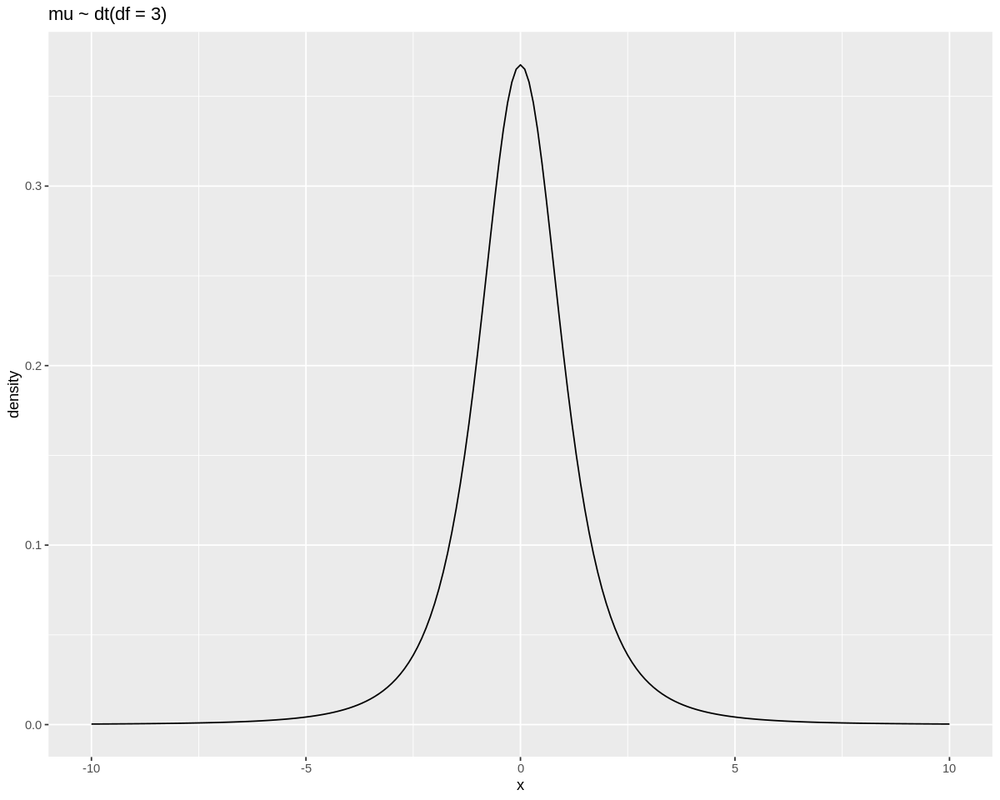

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)
p1 <-
  tibble(x = seq(from = -10, to = 10, by = .1)) %>%

  ggplot(aes(x = x, y = dt(x, df = 3))) +
  geom_line() +
  scale_x_continuous(breaks = seq(from = -10, to = 10, by = 5)) +
  labs(title = "mu ~ dt(df = 3)",
       y = "density")

p1

---

## Fit model

[Fit](https://paul-buerkner.github.io/brms/reference/brm.html) the model using Stan.

`formula`: An object of class [`formula`](https://rdrr.io/r/stats/formula.html), [`brmsformula`](https://paul-buerkner.github.io/brms/reference/brmsformula.html), or [`mvbrmsformula`](https://paul-buerkner.github.io/brms/reference/mvbrmsformula.html) (or one that can be coerced to that classes): A symbolic description of the model to be fitted. The details of model specification are explained in [`brmsformula`](https://paul-buerkner.github.io/brms/reference/brmsformula.html).

`family`: A description of the response distribution and link function to be used in the model. This can be a family function, a call to a family function or a character string naming the family. Every family function has a `link` argument allowing to specify the link function to be applied on the response variable. If not specified, default links are used. For details of supported families see [`brmsfamily`](https://paul-buerkner.github.io/brms/reference/brmsfamily.html). By default, a linear `gaussian` model is applied. In multivariate models, `family` might also be a list of families.

`iter`: The number of samples to draw from the posterior distribution. By default, all `brm` modeling functions will run **four** randomly initialized Markov chains, each for `2000` iterations (including a warmup period of `1000` iterations that is discarded).

`chains`: The number of chains to sample (defaults to **4**). Running independent chains is important for some convergence statistics and can also reveal multiple modes in the posterior.

`algorithm`: A string (possibly abbreviated) indicating the estimation approach to use. Can be `"sampling"` for MCMC (the **default**), `"optimizing"` for optimization, `"meanfield"` for variational inference with independent normal distributions, or `"fullrank"` for variational inference with a multivariate normal distribution. See [rstanarm-package](https://mc-stan.org/rstanarm/reference/rstanarm-package.html) for more details on the estimation algorithms.

[Markov Chain Monte Carlo (MCMC)](https://bookdown.org/content/4857/markov-chain-monte-carlo.html): This chapter introduces one commonplace example of [Fortuna](https://en.wikipedia.org/wiki/Rota_Fortunae#/media/File:Lydgate-siege-troy-wheel-fortune-detail.jpg) and [Minerva](https://en.wikipedia.org/wiki/Minerva#/media/File:Minerva-Vedder-Highsmith-detail-1.jpeg)'s cooperation: the estimation of posterior probability distributions using a stochastic process known as **Markov chain Monte Carlo (MCMC)** ([McElreath, 2020a, p. 263](https://bookdown.org/content/4857/markov-chain-monte-carlo.html#ref-mcelreathStatisticalRethinkingBayesian2020), **emphasis** in the original).

In [ ]:
m1 <- brm(switch ~ 1,
          data = wells,
          family = bernoulli(link = "logit"),
          seed = 241348,
          refresh=0)

m1

Compiling Stan program...

Start sampling



 Family: bernoulli 
  Links: mu = logit 
Formula: switch ~ 1 
   Data: wells (Number of observations: 3020) 
  Draws: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup draws = 4000

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept     0.30      0.04     0.23     0.38 1.00     1470     2247

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

[Fitted model objects](https://paul-buerkner.github.io/brms/reference/brmsfit-class.html)

Models fitted with the `brms` package are represented as a [`brmsfit`](https://paul-buerkner.github.io/brms/reference/brmsfit-class.html) object, which contains the posterior draws (samples), model formula, Stan code, relevant data, and other information.

[`print`](https://paul-buerkner.github.io/brms/reference/print.brmsfit.html): Print a summary for a fitted model represented by a `brmsfit` object.

[Reference](https://paul-buerkner.github.io/brms/reference/index.html)

* List of `brms` functions

## Plot MCMC diagnostics

[`mcmc_neff`](https://mc-stan.org/bayesplot/reference/MCMC-diagnostics.html): Ratios of effective sample size to total sample size as either points or a histogram. Values are colored using different shades (lighter is better). The chosen thresholds are somewhat arbitrary, but can be useful guidelines in practice.

[`mcmc_rhat`](https://mc-stan.org/bayesplot/reference/MCMC-diagnostics.html): [`R-hat`](https://mc-stan.org/bayesplot/articles/visual-mcmc-diagnostics.html#rhat-potential-scale-reduction-statistic) values as either points or a histogram. Values are colored using different shades (lighter is better). The chosen thresholds are somewhat arbitrary, but can be useful guidelines in practice.

[`mcmc_dens_overlay`](https://mc-stan.org/bayesplot/reference/MCMC-diagnostics.html): Various [types](https://mc-stan.org/bayesplot/reference/MCMC-distributions.html) of histograms and kernel density plots of MCMC draws.

[`mcmc_trace`](https://python.arviz.org/en/stable/examples/plot_trace.html): Trace and rank [plots](https://mc-stan.org/bayesplot/reference/MCMC-traces.html) of MCMC draws.

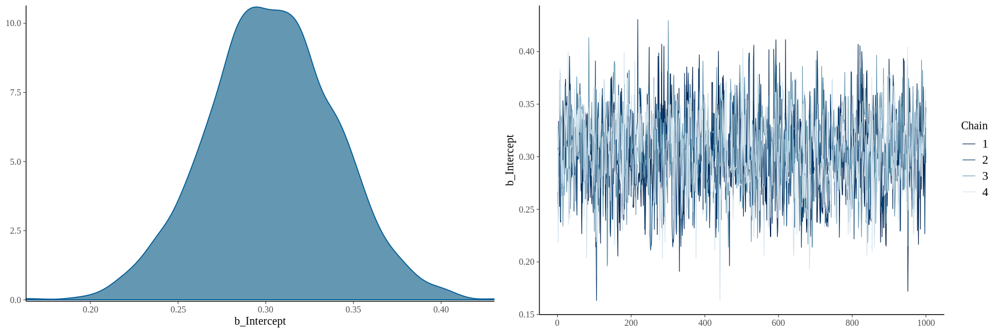

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5)
plot(m1)

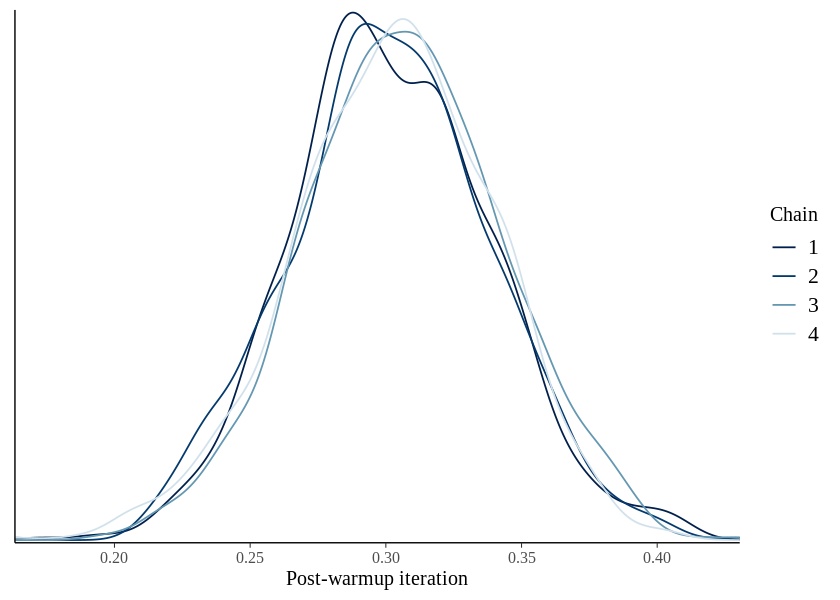

In [ ]:
options(repr.plot.width = 7, repr.plot.height = 5)
mcmc_dens_overlay(m1, pars = c("b_Intercept")) +
  xlab("Post-warmup iteration")

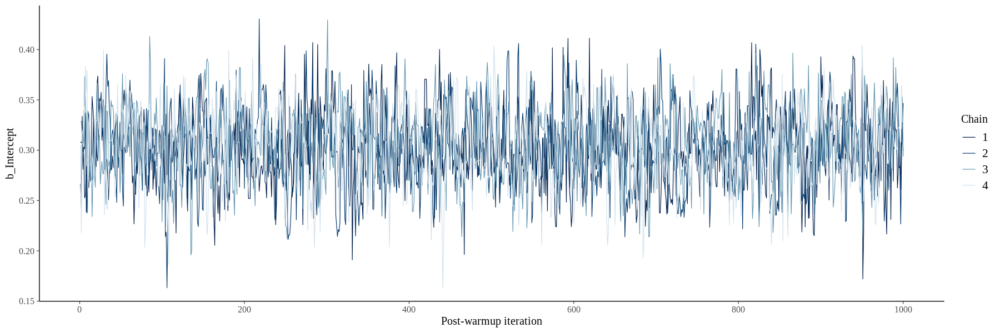

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5)
mcmc_trace(m1, pars = c("b_Intercept")) +
  xlab("Post-warmup iteration")

## Plot posterior distributions

The [posterior probability](https://en.wikipedia.org/wiki/Posterior_probability) is a type of [conditional probability](https://en.wikipedia.org/wiki/Conditional_probability) that results from [updating](https://en.wikipedia.org/wiki/Bayesian_updating) the [prior probability](https://en.wikipedia.org/wiki/Prior_probability) with information summarized by the [likelihood](https://en.wikipedia.org/wiki/Likelihood_function) via an application of [Bayes' rule](https://en.wikipedia.org/wiki/Bayes%27_rule).

Chapter 7 [The Posterior - The Goal of Bayesian
Inference](https://sites.math.rutgers.edu/~zeilberg/EM20/Lambert.pdf) in "A Student's Guide to Bayesian Statistics" by Ben Lambert

[`as.array` `as.matrix` `as.data.frame`](https://paul-buerkner.github.io/brms/reference/index.html): Extract the posterior sample -the post-warmup draws from the posterior distribution- from a fitted model object as a matrix, data frame, or array.

[`as_draws_df`](https://paul-buerkner.github.io/brms/reference/draws-brms.html): Transform a `brmsfit` object to a format supported by the `posterior` package.

[`pp_check`](https://mc-stan.org/bayesplot/reference/pp_check.html): Posterior (or prior) predictive checks (S3 generic and default method).

In [ ]:
m1_post <- as.array(m1)
dim(m1_post)

[1] 1000    4    3

In [ ]:
dimnames(m1_post)

In [ ]:
m1_post <- as_draws_df(m1)
head(m1_post)

b_Intercept,lprior,lp__,.chain,.iteration,.draw
<dbl>,<dbl>,<dbl>,<int>,<int>,<int>
0.2667822,-1.924757,-2061.458,1,1,1
0.2426158,-1.923448,-2062.320,1,2,2
0.3336991,-1.929022,-2061.327,1,3,3
0.2999129,-1.926751,-2060.980,1,4,4
0.2962189,-1.926517,-2060.993,1,5,5
0.2526910,-1.923979,-2061.908,1,6,6


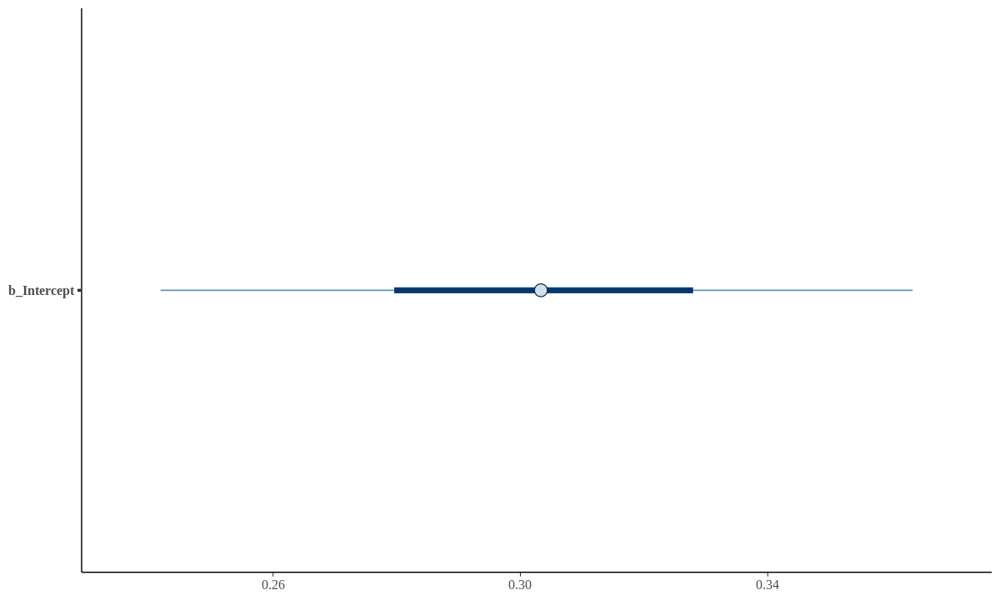

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 6)
mcmc_intervals(m1_post, pars = c("b_Intercept"))

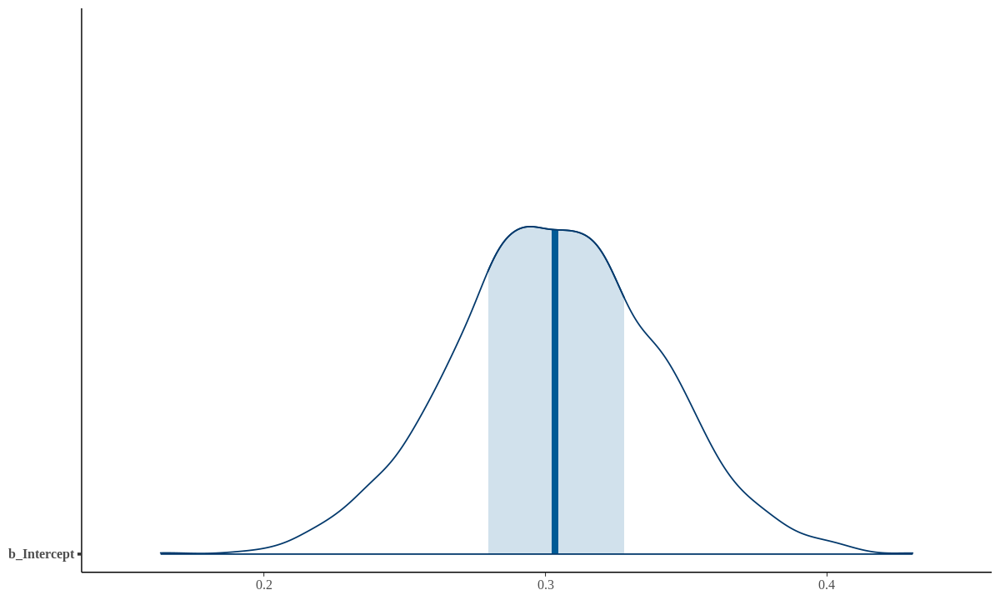

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 6)
mcmc_areas(m1_post, pars = c("b_Intercept"))

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


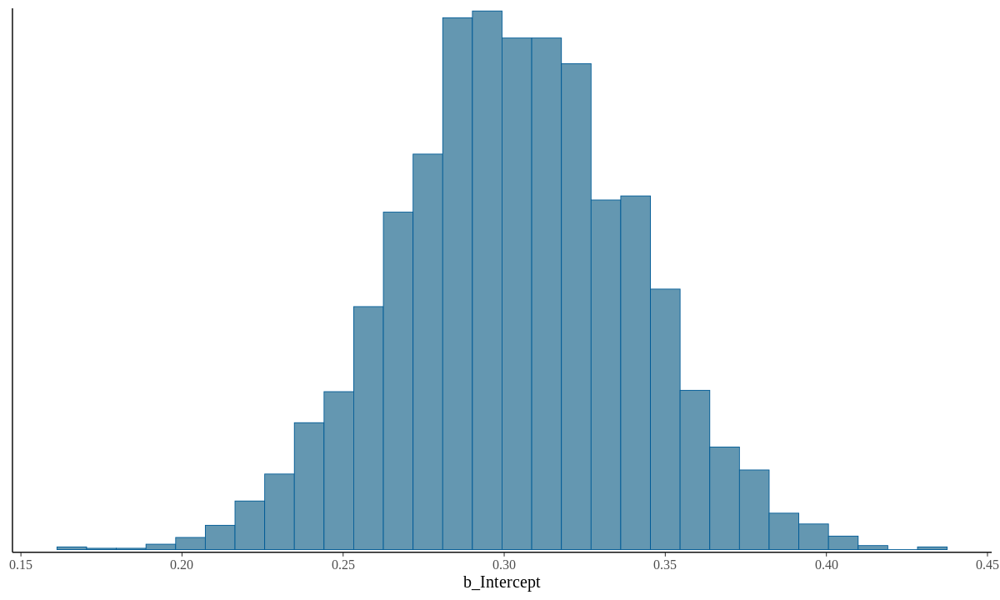

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 6)
mcmc_hist(m1_post, pars = c("b_Intercept"))

In [ ]:
summary(m1)

 Family: bernoulli 
  Links: mu = logit 
Formula: switch ~ 1 
   Data: wells (Number of observations: 3020) 
  Draws: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup draws = 4000

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept     0.30      0.04     0.23     0.38 1.00     1470     2247

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

## Plot posterior predictive distributions

[Posterior predictive checks (PPCs)](https://www.pymc.io/projects/docs/en/stable/learn/core_notebooks/posterior_predictive.html) are a great way to validate a model. The idea is to generate data from the model using parameters from draws from the posterior.

Elaborating slightly, one can say that PPCs analyze the degree to which data generated from the model deviate from data generated from the true distribution. So, often you will want to know if, for example, your posterior distribution is approximating your underlying distribution. The visualization aspect of this model evaluation method is also great for a 'sense check' or explaining your model to others and getting criticism.

[Graphical posterior predictive checks (PPCs)](https://mc-stan.org/bayesplot/articles/graphical-ppcs.html)

The `bayesplot` package provides various plotting functions for graphical posterior predictive checking, that is, creating graphical displays comparing observed data to simulated data from the posterior predictive distribution ([Gabry et al, 2019](https://mc-stan.org/bayesplot/articles/graphical-ppcs.html#gabry2019)).

The idea behind [posterior predictive checking](https://mc-stan.org/docs/stan-users-guide/posterior-prediction.html) is simple: if a model is a good fit then we should be able to use it to generate data that looks a lot like the data we observed. To generate the data used for posterior predictive checks (PPCs) we simulate from the posterior predictive distribution. This is the distribution of the outcome variable implied by a model after using the observed data 𝑦 (a vector of 𝑁 outcome values) to update our beliefs about unknown model parameters 𝜃.

[`posterior_predict`](https://paul-buerkner.github.io/brms/reference/posterior_predict.brmsfit.html): Compute posterior draws of the posterior predictive distribution. Can be performed for the data used to fit the model (posterior predictive checks) or for new data. By definition, these draws have higher variance than draws of the means of the posterior predictive distribution computed by `posterior_epred.brmsfit`. This is because the residual error is incorporated in `posterior_predict`. However, the estimated means of both methods averaged across draws should be very similar.

[`ppc_dens_overlay`](https://mc-stan.org/bayesplot/reference/PPD-distributions.html): Plot posterior or prior predictive distributions. Each of these functions makes the same plot as the corresponding `ppc_` function but without plotting any observed data `y`.

Using 10 posterior draws for ppc type 'dens_overlay' by default.



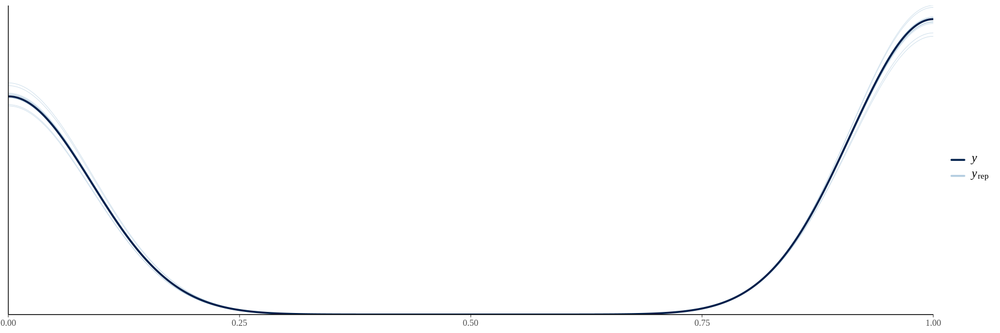

In [ ]:
pp_check(m1)

In [ ]:
y <- wells$switch

In [ ]:
yrep_m1 <- posterior_predict(m1, draws = 500)
dim(yrep_m1)

[1] 4000 3020

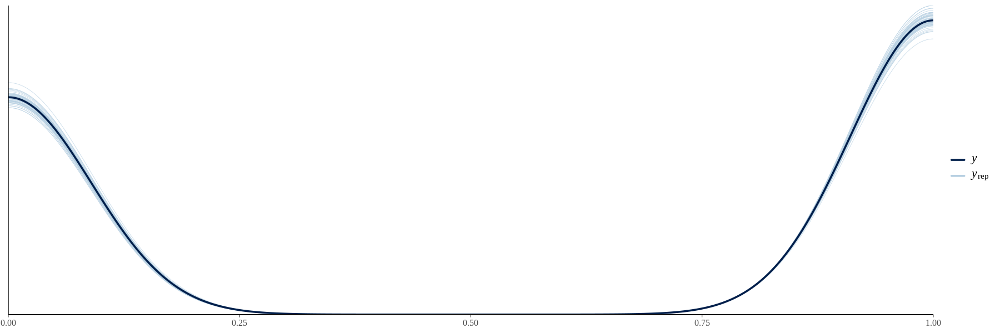

In [ ]:
ppc_dens_overlay(y, yrep_m1[1:50, ])

[loo](https://mc-stan.org/loo/index.html): Efficient approximate leave-one-out cross-validation for fitted Bayesian models

From existing posterior simulation draws, we compute approximate `LOO-CV` using Pareto smoothed importance sampling (`PSIS`), a new procedure for regularizing importance weights. As a byproduct of our calculations, we also obtain approximate standard errors for estimated predictive errors and for comparing predictive errors between two models. We recommend `PSIS-LOO-CV` instead of `WAIC`, because `PSIS` provides useful diagnostics and effective sample size and Monte Carlo standard error estimates.

[`loo`](https://paul-buerkner.github.io/brms/reference/loo.brmsfit.html): Perform approximate leave-one-out cross-validation based on the posterior likelihood using the loo package.

Estimates the expected log pointwise predictive density (elpd) using Pareto-smoothed importance sampling leave-one-out cross-validation (PSIS-LOO-CV). Also calculates LOO's standard error and the effective number of parameters. Read more theory here https://arxiv.org/abs/1507.04544 and here https://arxiv.org/abs/1507.02646

In [ ]:
loo1 = loo(m1)
loo1


Computed from 4000 by 3020 log-likelihood matrix

         Estimate   SE
elpd_loo  -2060.0  8.2
p_loo         1.0  0.0
looic      4120.1 16.5
------
Monte Carlo SE of elpd_loo is 0.0.

All Pareto k estimates are good (k < 0.5).
See help('pareto-k-diagnostic') for details.

[LOO package glossary](https://mc-stan.org/loo/reference/loo-glossary.html)

`elpd`: approximated expected log pointwise predictive density (elpd).

`se`: standard error of the elpd.

`p_loo`: effective number of parameters. If we have a well-specified model, we expect the estimated effective number of parameters (`p_loo`) to be smaller than or similar to the total number of parameters in the model.

Pareto 𝑘 diagnostic values are used to assess the reliability of the estimates. In addition to the proportion of leave-one-out folds with 𝑘 values in different intervals, the minimum of the effective sample sizes in that category is shown to give idea why higher 𝑘 values are bad.

---

# An index variable (or a binary indicator)

### Estimating a difference is the same as regressing on an indicator variable (Student's two-sample t-test)

## Summarize variables

In [ ]:
median(wells$arsenic)

[1] 1.3

In [ ]:
# Rescale distance into 100-meter units
wells$dist100 <- wells$dist / 100.0

# Create jittered version of switch for plots
# Create binary variable
n <- length(wells$switch)

wells <- wells %>%
    mutate(switch_jitter = ifelse(wells$switch == 0,
                                  wells$switch + runif(n, 0, .1),
                                  wells$switch - runif(n, 0, .1)),
           arsenic_high = ifelse(wells$arsenic >= median(wells$arsenic), 1, 0))

glimpse(wells)

Rows: 3,020
Columns: 9
$ switch        <dbl> 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,…
$ arsenic       <dbl> 2.36, 0.71, 2.07, 1.15, 1.10, 3.90, 2.97, 3.24, 3.28, 2.…
$ dist          <dbl> 16.826, 47.322, 20.967, 21.486, 40.874, 69.518, 80.711, …
$ dist100       <dbl> 0.16826, 0.47322, 0.20967, 0.21486, 0.40874, 0.69518, 0.…
$ assoc         <dbl> 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1,…
$ educ          <dbl> 0, 0, 10, 12, 14, 9, 4, 10, 0, 0, 5, 0, 0, 0, 0, 7, 7, 7…
$ educ4         <dbl> 0.00, 0.00, 2.50, 3.00, 3.50, 2.25, 1.00, 2.50, 0.00, 0.…
$ switch_jitter <dbl> 0.92087715, 0.99736152, 0.07820136, 0.97220201, 0.985619…
$ arsenic_high  <dbl> 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,…


In [ ]:
tapply(wells$switch, wells$arsenic_high, summary)

$`0`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.4954  1.0000  1.0000 

$`1`
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  1.0000  0.6548  1.0000  1.0000 


In [ ]:
wells %>%
  dplyr::select(arsenic_high, switch) %>%
  group_by(arsenic_high) %>%
  summarise(count = n(),
            mean = mean(switch),
            std = sd(switch),
            min = min(switch),
            `25%` = quantile(switch, 0.25),
            `50%` = quantile(switch, 0.25),
            `75%` = quantile(switch, 0.75),
            max = max(switch)) %>%
  round(., 1)

arsenic_high,count,mean,std,min,25%,50%,75%,max
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0,1508,0.5,0.5,0,0,0,1,1
1,1512,0.7,0.5,0,0,0,1,1


## Plot data

In [ ]:
dat <- wells %>% group_by(arsenic_high) %>% summarise(mean = mean(switch))

arsenic_high,mean
<dbl>,<dbl>
0,0.4953581
1,0.6547619


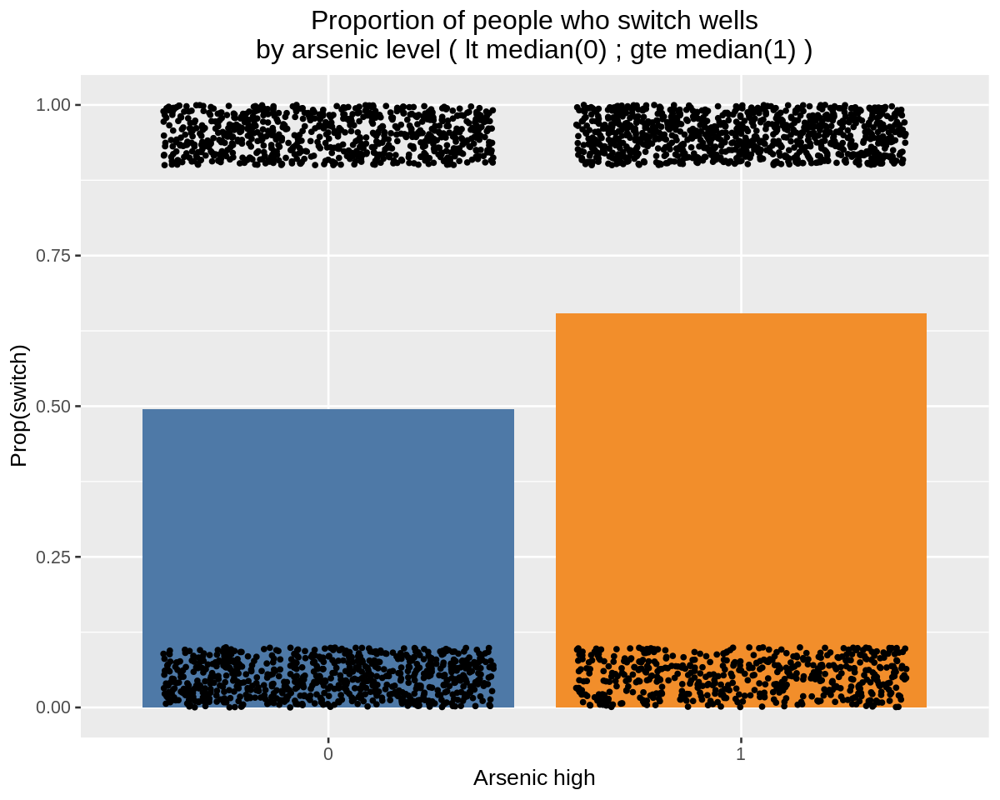

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)

data <- wells %>% group_by(arsenic_high) %>% summarise(mean = mean(switch))

p_switched = sprintf("Prop(switch)\n mu=%.1f", round(n_switched / (n_switched+n_didnt_switch), 1))

ggplot(data, aes(x = factor(arsenic_high), y = mean, fill = factor(arsenic_high))) +
    geom_col() +
    geom_jitter(data = wells, aes(x = factor(arsenic_high), y = switch_jitter)) +
    scale_color_manual(name = "",
                       values = c("#4E79A7", "#F28E2B"),
                       aesthetics = c("colour", "fill")) +
    labs(x = "Arsenic high",
         y = "Prop(switch)",
         title = "Proportion of people who switch wells\nby arsenic level ( lt median(0) ; gte median(1) )") +
    theme_grey(base_size = 16) +
    theme(plot.title = element_text(hjust = 0.5),
          legend.position = "none")

In [ ]:
post1 <- stan_glm(switch ~ 1 + arsenic_high,
                  data = wells,
                  family = binomial(link = "logit"),
                  seed = 241348,
                  refresh=0)

Warning message:
“Multiple drawing groups in `geom_function()`
ℹ Did you use the correct group, colour, or fill aesthetics?”


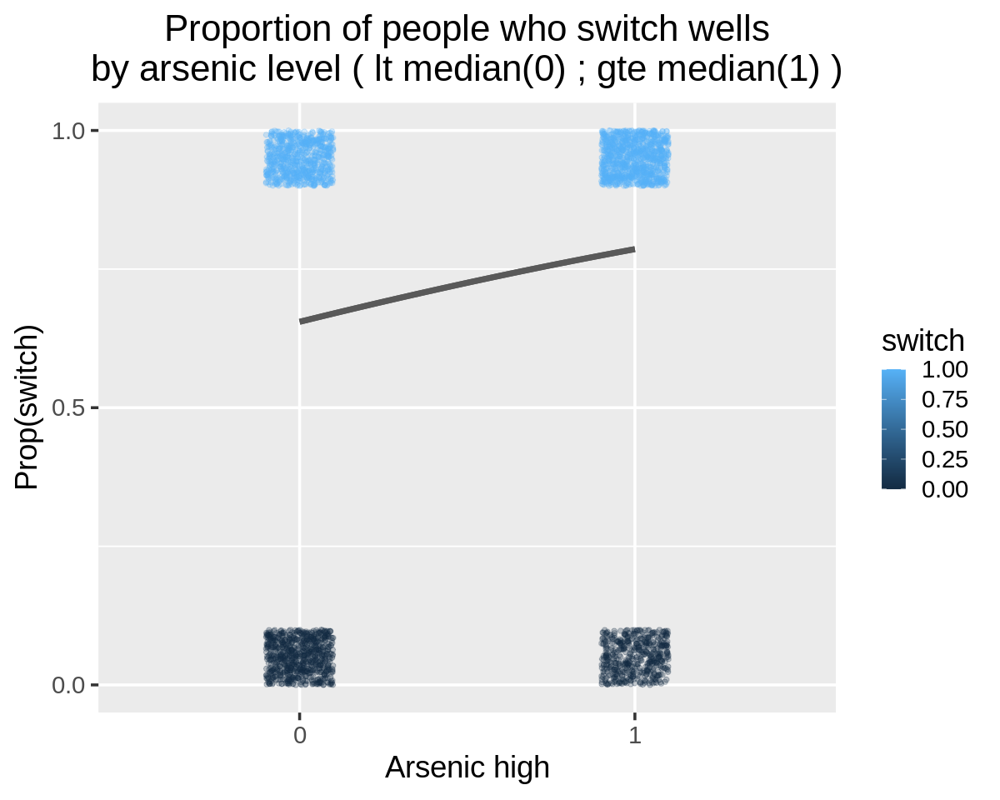

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)

# Predicted probability as a function of x
pr_switch <- function(x, ests) plogis(ests[1] + ests[2] * x)

ggplot(wells, aes(x = factor(arsenic_high), y = switch_jitter, colour = switch)) +
    geom_jitter(width = 0.1, alpha = 0.25) +
    geom_function(fun = pr_switch, args = list(ests = coef(post1)),
                  linewidth = 2, color = "gray35") +
    scale_y_continuous(breaks = c(0, 0.5, 1)) +
    labs(x = 'Arsenic high',
         y = 'Prop(switch)',
         title = "Proportion of people who switch wells\nby arsenic level ( lt median(0) ; gte median(1) )") +
    theme_grey(base_size = 22) +
    theme(plot.title = element_text(hjust = 0.5))

## Plot model

In [ ]:
m2 <- stan_glm(switch ~ 1 + arsenic_high,
               data = wells,
               family = binomial(link = "logit"),
               seed = 241348,
               refresh=0)

m2

stan_glm
 family:       binomial [logit]
 formula:      switch ~ 1 + arsenic_high
 observations: 3020
 predictors:   2
------
             Median MAD_SD
(Intercept)  0.0    0.0   
arsenic_high 0.7    0.1   

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

In [ ]:
summary(m2)


Model Info:
 function:     stan_glm
 family:       binomial [logit]
 formula:      switch ~ 1 + arsenic_high
 algorithm:    sampling
 sample:       4000 (posterior sample size)
 priors:       see help('prior_summary')
 observations: 3020
 predictors:   2

Estimates:
               mean   sd   10%   50%   90%
(Intercept)   0.0    0.1 -0.1   0.0   0.0 
arsenic_high  0.7    0.1  0.6   0.7   0.8 

Fit Diagnostics:
           mean   sd   10%   50%   90%
mean_PPD 0.6    0.0  0.6   0.6   0.6  

The mean_ppd is the sample average posterior predictive distribution of the outcome variable (for details see help('summary.stanreg')).

MCMC diagnostics
              mcse Rhat n_eff
(Intercept)   0.0  1.0  2786 
arsenic_high  0.0  1.0  2701 
mean_PPD      0.0  1.0  3409 
log-posterior 0.0  1.0  1958 

For each parameter, mcse is Monte Carlo standard error, n_eff is a crude measure of effective sample size, and Rhat is the potential scale reduction factor on split chains (at convergence Rhat=1).

## Plot MCMC diagnostics

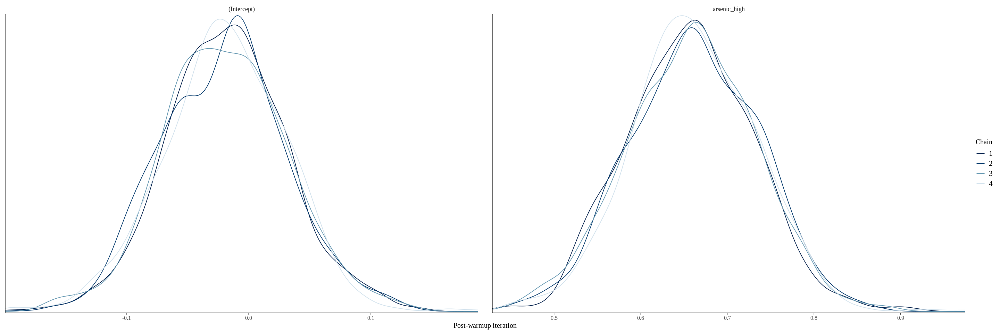

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_dens_overlay(m2) +
  xlab("Post-warmup iteration")

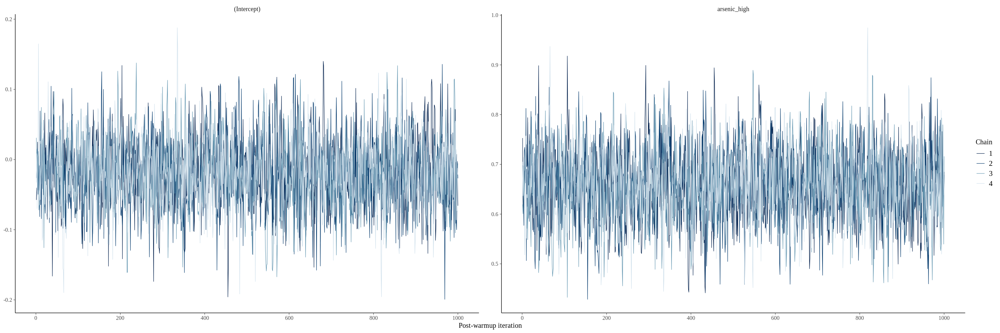

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_trace(m2) +
  xlab("Post-warmup iteration")

## Plot posterior distributions

In [ ]:
m2_post <- as.array(m2)
dim(m2_post)

[1] 1000    4    2

In [ ]:
dimnames(m2_post)

$iterations
NULL

$chains
[1] "chain:1" "chain:2" "chain:3" "chain:4"

$parameters
[1] "(Intercept)"  "arsenic_high"

In [ ]:
m2_post <- as_draws_df(m2)
head(m2_post)

(Intercept),arsenic_high,.chain,.iteration,.draw
<dbl>,<dbl>,<int>,<int>,<int>
-0.057527161,0.7528964,1,1,1
-0.040424668,0.6131973,1,2,2
-0.052166103,0.6383994,1,3,3
0.024895559,0.6127601,1,4,4
-0.006045935,0.6495062,1,5,5
-0.019530029,0.6869115,1,6,6


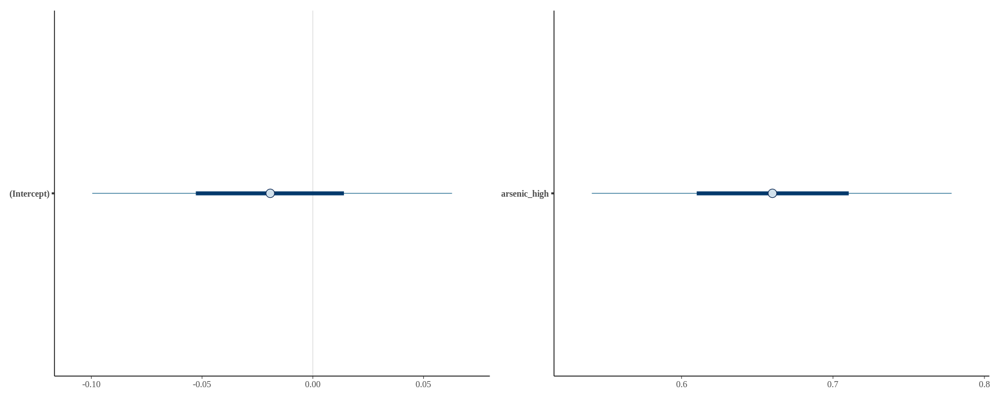

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
g1 <- mcmc_intervals(m2_post, pars = c("(Intercept)"))
g2 <- mcmc_intervals(m2_post, pars = c("arsenic_high"))
g1 + g2

Warning message:
“Dropping 'draws_df' class as required metadata was removed.”


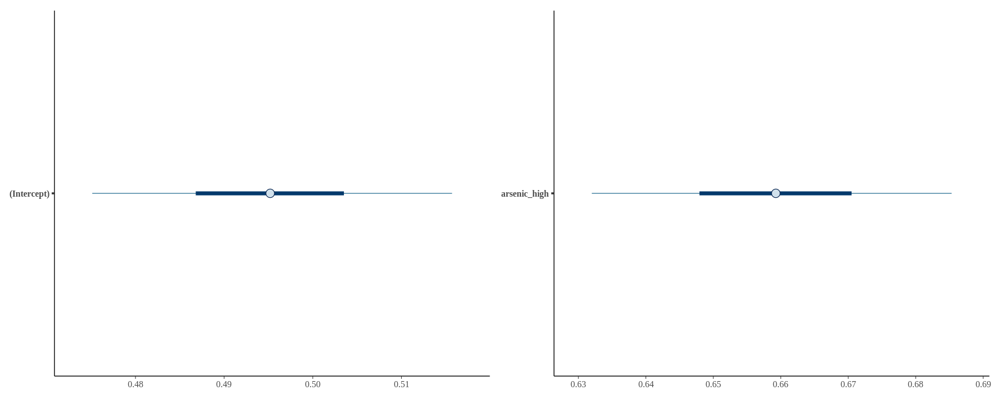

In [ ]:
# Inverse-logit function: plogis()

options(repr.plot.width = 15, repr.plot.height = 6)
m2_post_plogis <- as_tibble(lapply(m2_post[c('(Intercept)', 'arsenic_high')], plogis))
g1 <- mcmc_intervals(m2_post_plogis, pars = c("(Intercept)"))
g2 <- mcmc_intervals(m2_post_plogis, pars = c("arsenic_high"))
g1 + g2

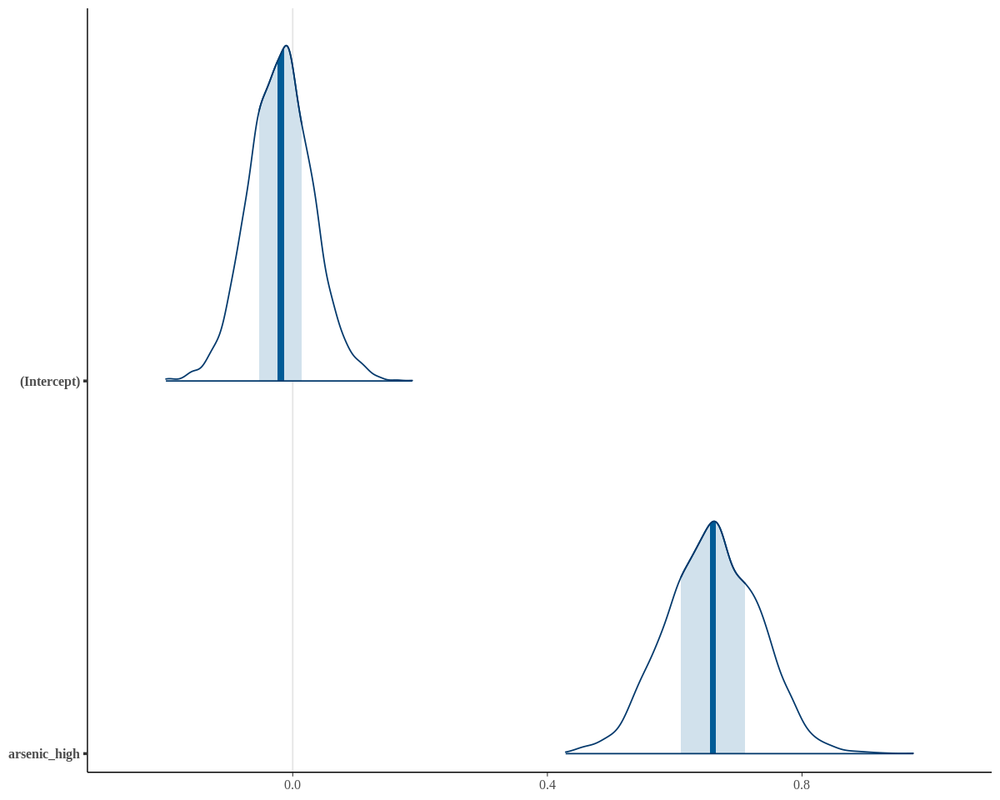

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)
mcmc_areas(m2_post)

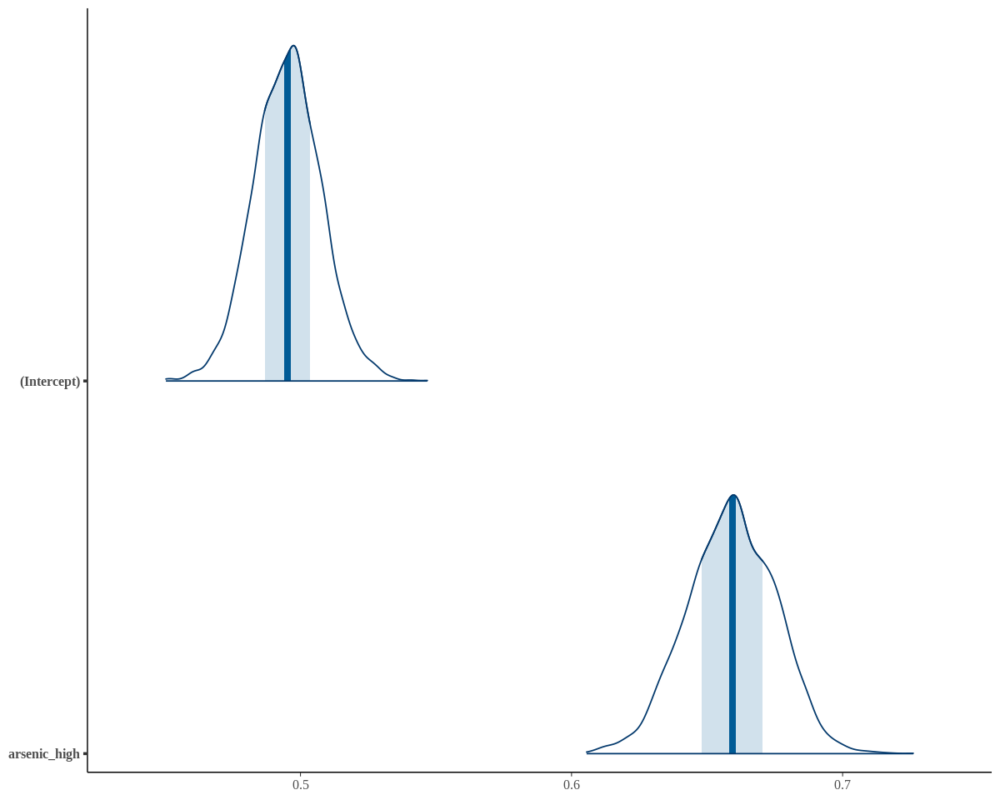

In [ ]:
# Inverse-logit function: plogis()

options(repr.plot.width = 10, repr.plot.height = 8)
mcmc_areas(m2_post_plogis)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


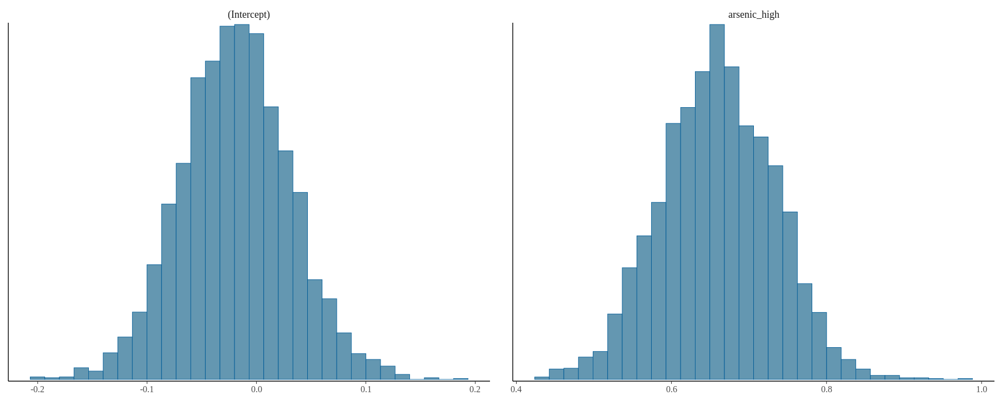

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
mcmc_hist(m2_post)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


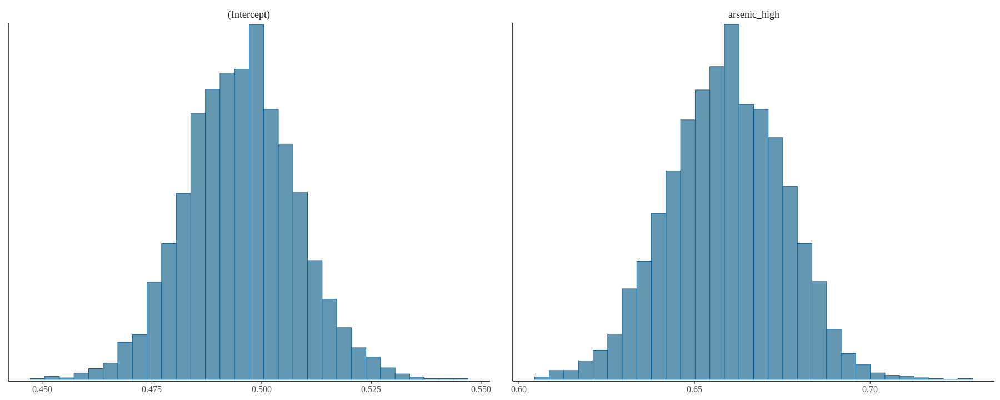

In [ ]:
# Inverse-logit function: plogis()

options(repr.plot.width = 15, repr.plot.height = 6)
mcmc_hist(m2_post_plogis)

## Interpret results

In [ ]:
print(m2)

stan_glm
 family:       binomial [logit]
 formula:      switch ~ 1 + arsenic_high
 observations: 3020
 predictors:   2
------
             Median MAD_SD
(Intercept)  0.0    0.0   
arsenic_high 0.7    0.1   

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


## Plot posterior predictive distributions

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


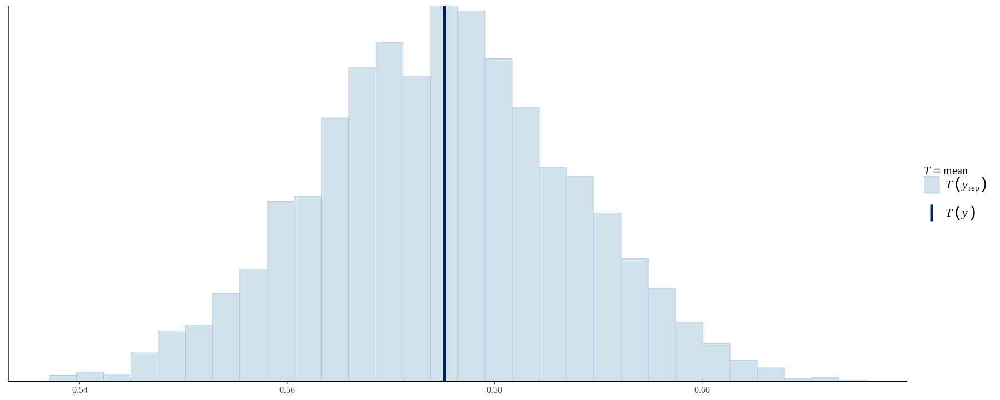

In [ ]:
pp_check(m2, plotfun = "stat", stat = "mean")

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


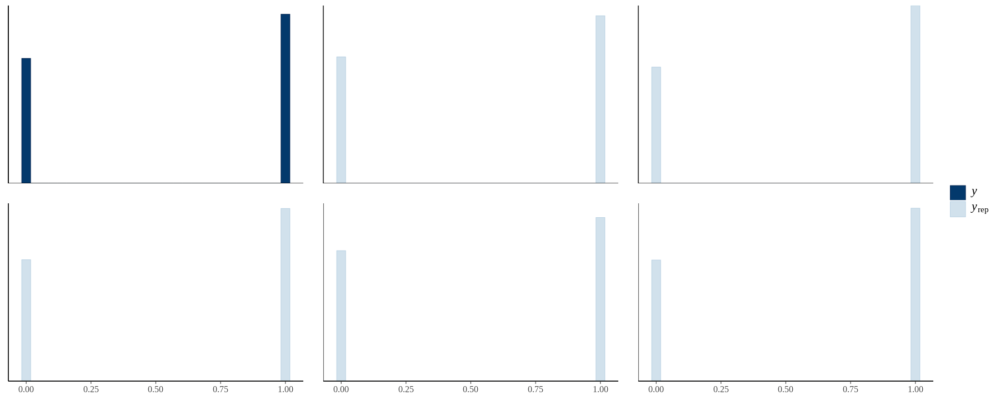

In [ ]:
pp_check(m2, plotfun = "hist", nreps = 5)

In [ ]:
y <- wells$switch

In [ ]:
yrep_m2 <- posterior_predict(m2, draws = 500)
dim(yrep_m2)

[1]  500 3020

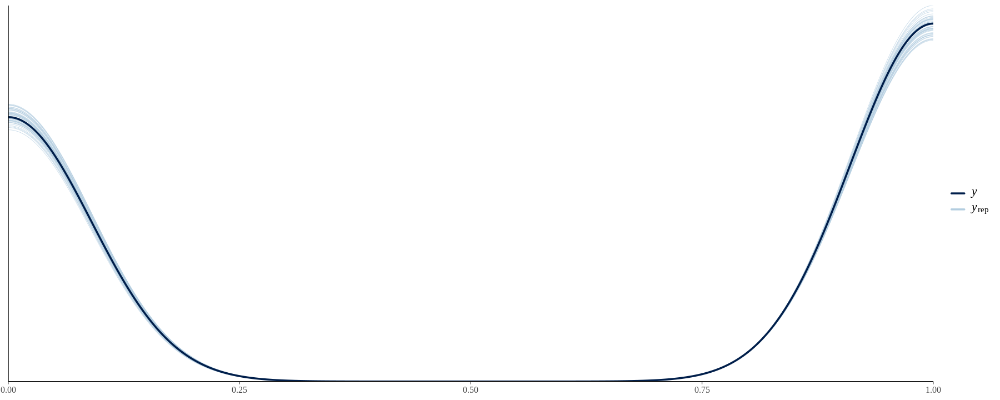

In [ ]:
ppc_dens_overlay(y, yrep_m2[1:50, ])

In [ ]:
loo2 = loo(m2)
loo2


Computed from 4000 by 3020 log-likelihood matrix

         Estimate   SE
elpd_loo  -2021.5 11.9
p_loo         1.9  0.0
looic      4043.0 23.9
------
Monte Carlo SE of elpd_loo is 0.0.

All Pareto k estimates are good (k < 0.5).
See help('pareto-k-diagnostic') for details.

In [ ]:
draws <- as.data.frame(m2)
colnames(draws)[1:2] <- c("a", "b")
glimpse(draws)

Rows: 4,000
Columns: 2
$ a <dbl> -0.057527161, -0.040424668, -0.052166103, 0.024895559, -0.006045935,…
$ b <dbl> 0.7528964, 0.6131973, 0.6383994, 0.6127601, 0.6495062, 0.6869115, 0.…


In [ ]:
m2b <- stan_glm(switch ~ 1 + arsenic,
                data = wells,
                family = binomial(link = "logit"),
                seed = 241348,
                refresh=0)

m2b

stan_glm
 family:       binomial [logit]
 formula:      switch ~ 1 + arsenic
 observations: 3020
 predictors:   2
------
            Median MAD_SD
(Intercept) -0.3    0.1  
arsenic      0.4    0.0  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

---

# A continuous variable

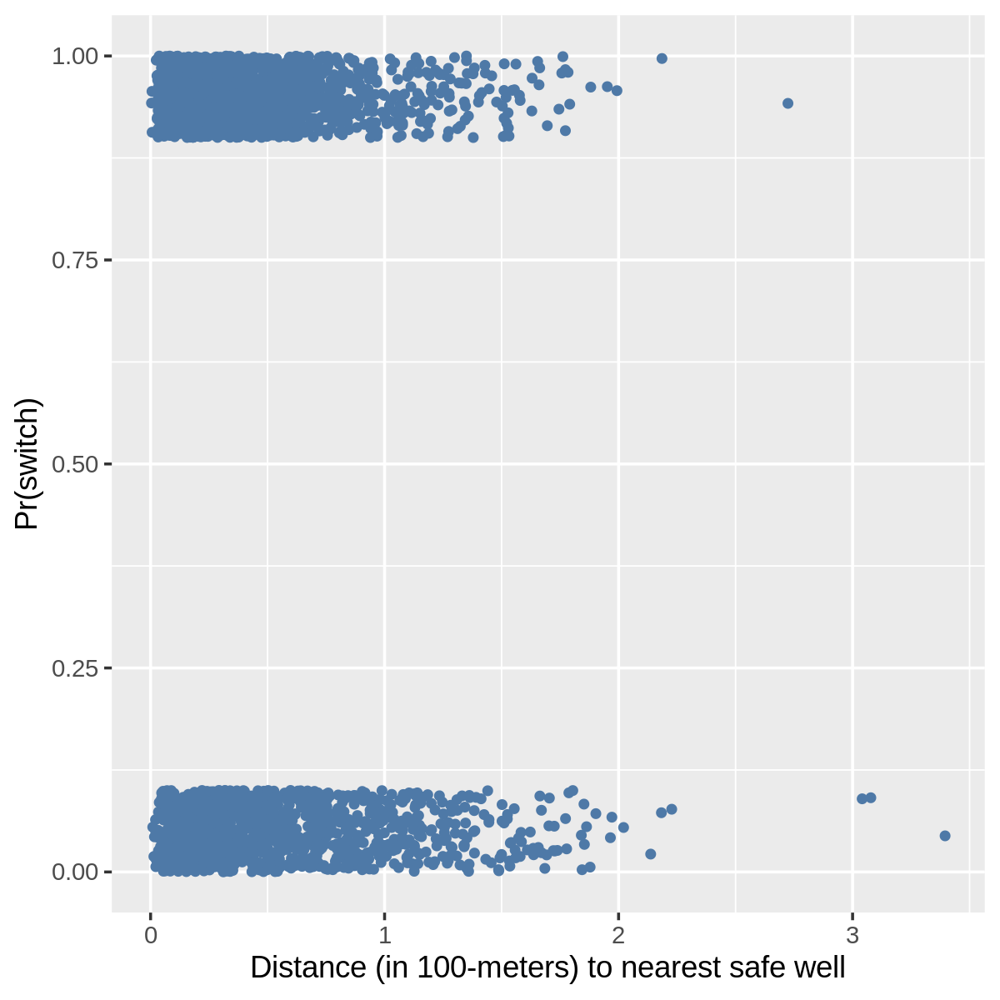

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

ggplot(wells, aes(x = dist100, y = switch_jitter)) +
  geom_point(size = 3, colour = "#4E79A7") +
  labs(x = 'Distance (in 100-meters) to nearest safe well',
       y = 'Pr(switch)') +
  theme_grey(base_size = 22) +
  theme(plot.title = element_text(hjust = 0.5))

## Plot model

In [ ]:
m3 <- stan_glm(switch ~ 1 + dist100,
               data = wells,
               family = binomial(link = "logit"),
               seed = 241348,
               refresh=0)

m3

stan_glm
 family:       binomial [logit]
 formula:      switch ~ 1 + dist100
 observations: 3020
 predictors:   2
------
            Median MAD_SD
(Intercept)  0.6    0.1  
dist100     -0.6    0.1  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg

In [ ]:
summary(m3)


Model Info:
 function:     stan_glm
 family:       binomial [logit]
 formula:      switch ~ 1 + dist100
 algorithm:    sampling
 sample:       4000 (posterior sample size)
 priors:       see help('prior_summary')
 observations: 3020
 predictors:   2

Estimates:
              mean   sd   10%   50%   90%
(Intercept)  0.6    0.1  0.5   0.6   0.7 
dist100     -0.6    0.1 -0.8  -0.6  -0.5 

Fit Diagnostics:
           mean   sd   10%   50%   90%
mean_PPD 0.6    0.0  0.6   0.6   0.6  

The mean_ppd is the sample average posterior predictive distribution of the outcome variable (for details see help('summary.stanreg')).

MCMC diagnostics
              mcse Rhat n_eff
(Intercept)   0.0  1.0  2838 
dist100       0.0  1.0  2783 
mean_PPD      0.0  1.0  3489 
log-posterior 0.0  1.0  1812 

For each parameter, mcse is Monte Carlo standard error, n_eff is a crude measure of effective sample size, and Rhat is the potential scale reduction factor on split chains (at convergence Rhat=1).

## Plot MCMC diagnostics

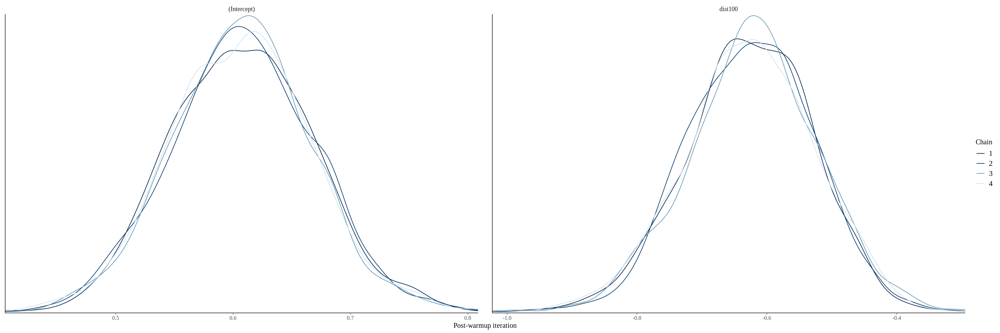

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_dens_overlay(m3) +
  xlab("Post-warmup iteration")

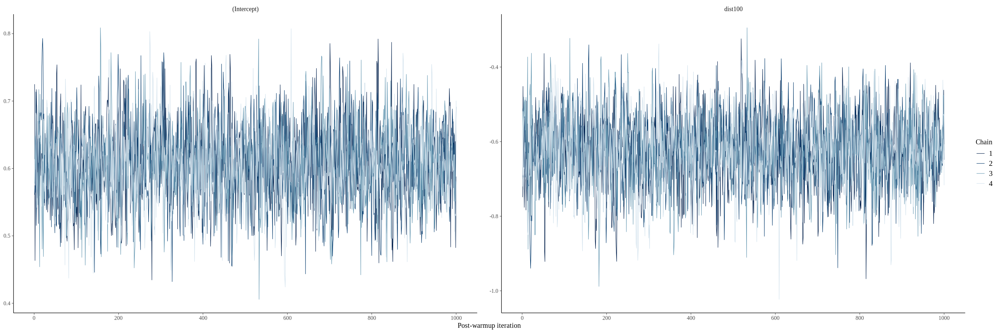

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_trace(m3) +
  xlab("Post-warmup iteration")

## Plot posterior distributions

In [ ]:
m3_post <- as.array(m3)
dim(m3_post)

[1] 1000    4    2

In [ ]:
dimnames(m3_post)

$iterations
NULL

$chains
[1] "chain:1" "chain:2" "chain:3" "chain:4"

$parameters
[1] "(Intercept)" "dist100"

In [ ]:
m3_post <- as_draws_df(m3)
head(m3_post)

(Intercept),dist100,.chain,.iteration,.draw
<dbl>,<dbl>,<int>,<int>,<int>
0.7249578,-0.7489371,1,1,1
0.4634031,-0.4518014,1,2,2
0.5904867,-0.5864300,1,3,3
0.6194285,-0.6824080,1,4,4
0.7170907,-0.7762803,1,5,5
0.6848998,-0.6943713,1,6,6


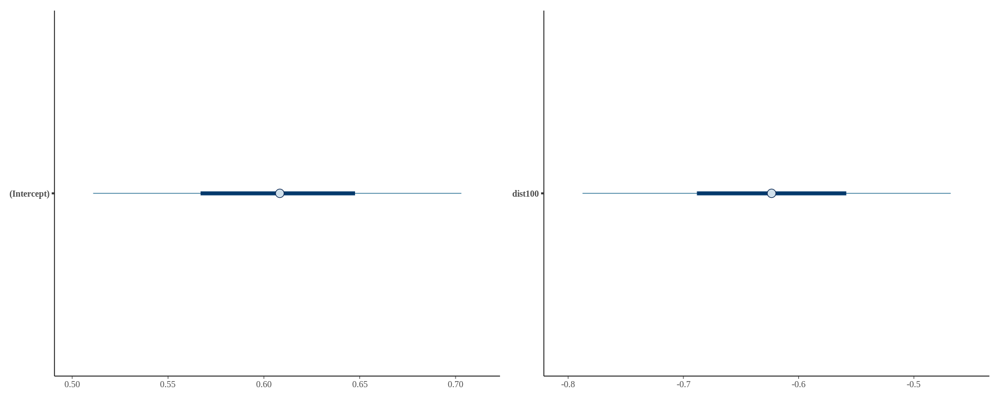

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
g1 <- mcmc_intervals(m3_post, pars = c("(Intercept)"))
g2 <- mcmc_intervals(m3_post, pars = c("dist100"))
g1 + g2

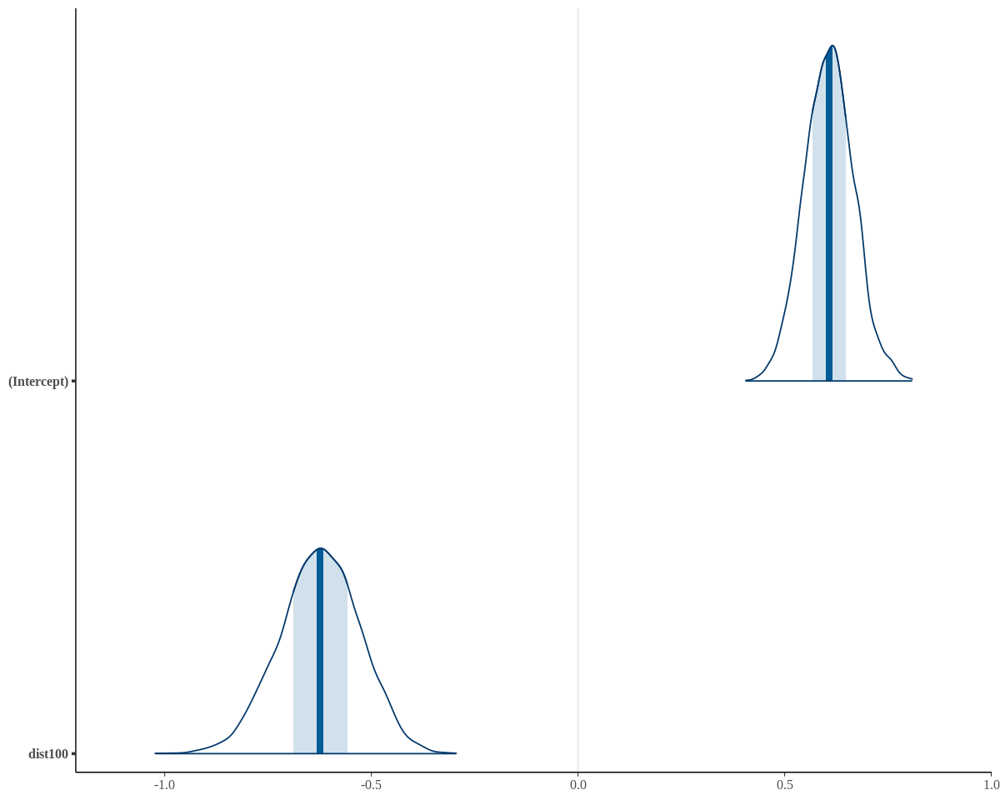

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)
mcmc_areas(m3_post)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


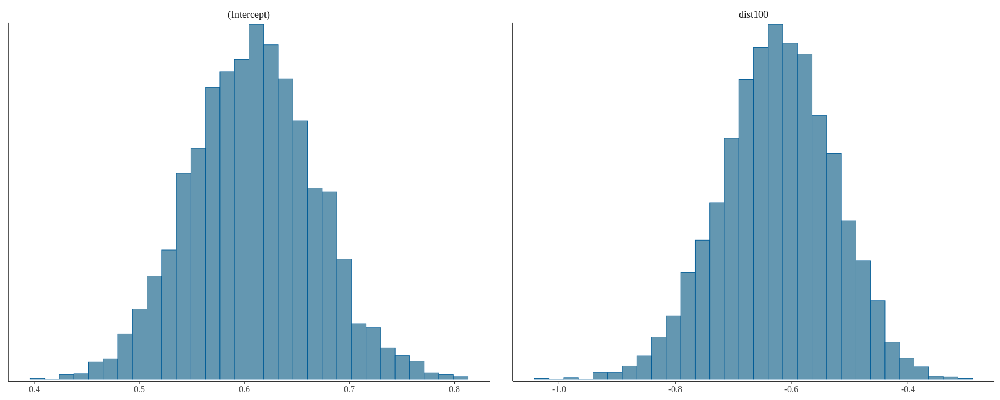

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
mcmc_hist(m3_post)

## Interpret results

In [ ]:
print(m3)

stan_glm
 family:       binomial [logit]
 formula:      switch ~ 1 + dist100
 observations: 3020
 predictors:   2
------
            Median MAD_SD
(Intercept)  0.6    0.1  
dist100     -0.6    0.1  

------
* For help interpreting the printed output see ?print.stanreg
* For info on the priors used see ?prior_summary.stanreg


## Plot posterior predictive distributions

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


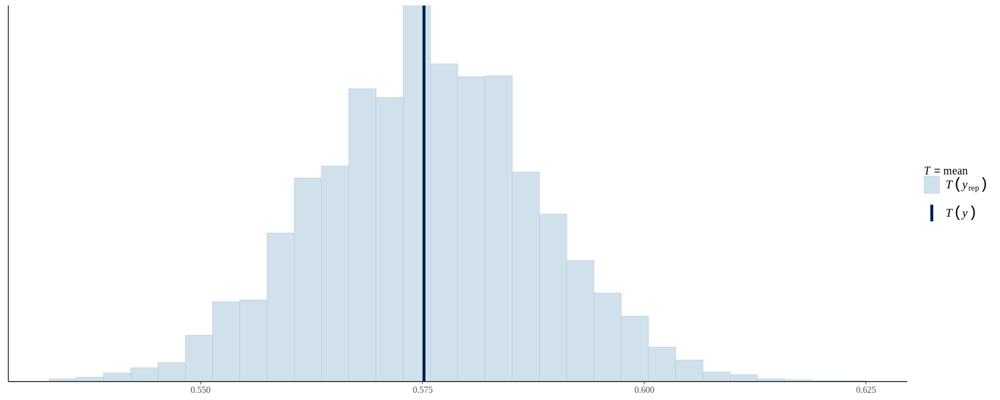

In [ ]:
pp_check(m3, plotfun = "stat", stat = "mean")

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


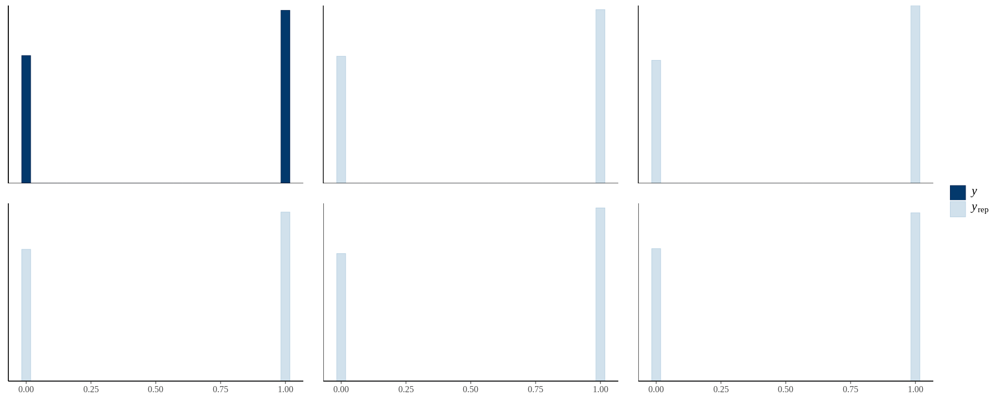

In [ ]:
pp_check(m3, plotfun = "hist", nreps = 5)

In [ ]:
y <- wells$switch

In [ ]:
yrep_m3 <- posterior_predict(m3, draws = 500)
dim(yrep_m3)

[1]  500 3020

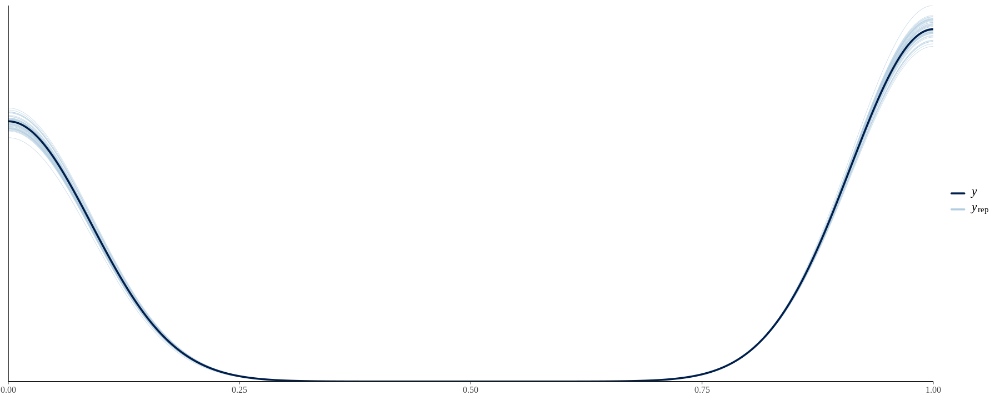

In [ ]:
ppc_dens_overlay(y, yrep_m3[1:50, ])

In [ ]:
loo3 = loo(m3)
loo3


Computed from 4000 by 3020 log-likelihood matrix

         Estimate   SE
elpd_loo  -2040.1 10.4
p_loo         2.0  0.0
looic      4080.3 20.9
------
Monte Carlo SE of elpd_loo is 0.0.

All Pareto k estimates are good (k < 0.5).
See help('pareto-k-diagnostic') for details.

In [ ]:
draws <- as.data.frame(m3)
colnames(draws)[1:2] <- c("a", "b")
glimpse(draws)

Rows: 4,000
Columns: 2
$ a <dbl> 0.7249578, 0.4634031, 0.5904867, 0.6194285, 0.7170907, 0.6848998, 0.…
$ b <dbl> -0.7489371, -0.4518014, -0.5864300, -0.6824080, -0.7762803, -0.69437…


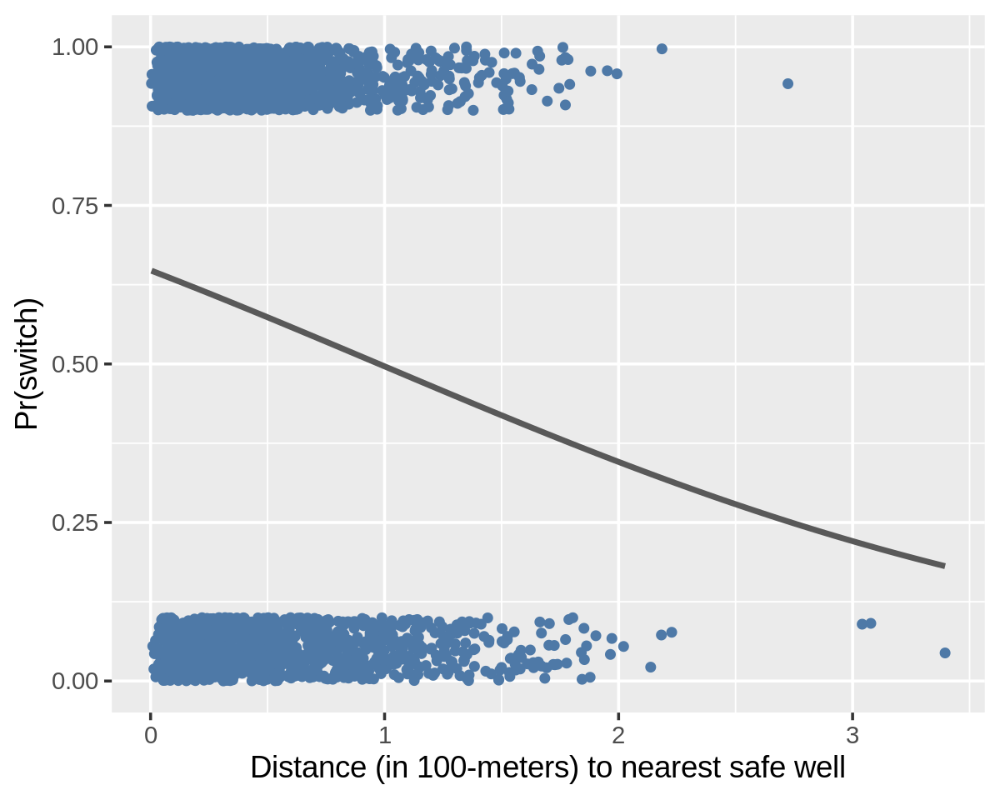

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)

# Predicted probability as a function of x
pr_switch <- function(x, ests) plogis(ests[1] + ests[2] * x)

ggplot(wells, aes(x = dist100, y = switch_jitter)) +
    geom_point(size = 3, colour = "#4E79A7") +
    geom_function(fun = pr_switch, args = list(ests = coef(m3)),
                  size = 2, color = "gray35") +
    labs(x = 'Distance (in 100-meters) to nearest safe well',
         y = 'Pr(switch)') +
    theme_grey(base_size = 22) +
    theme(plot.title = element_text(hjust = 0.5))

---

## Two continuous predictors (no interaction)

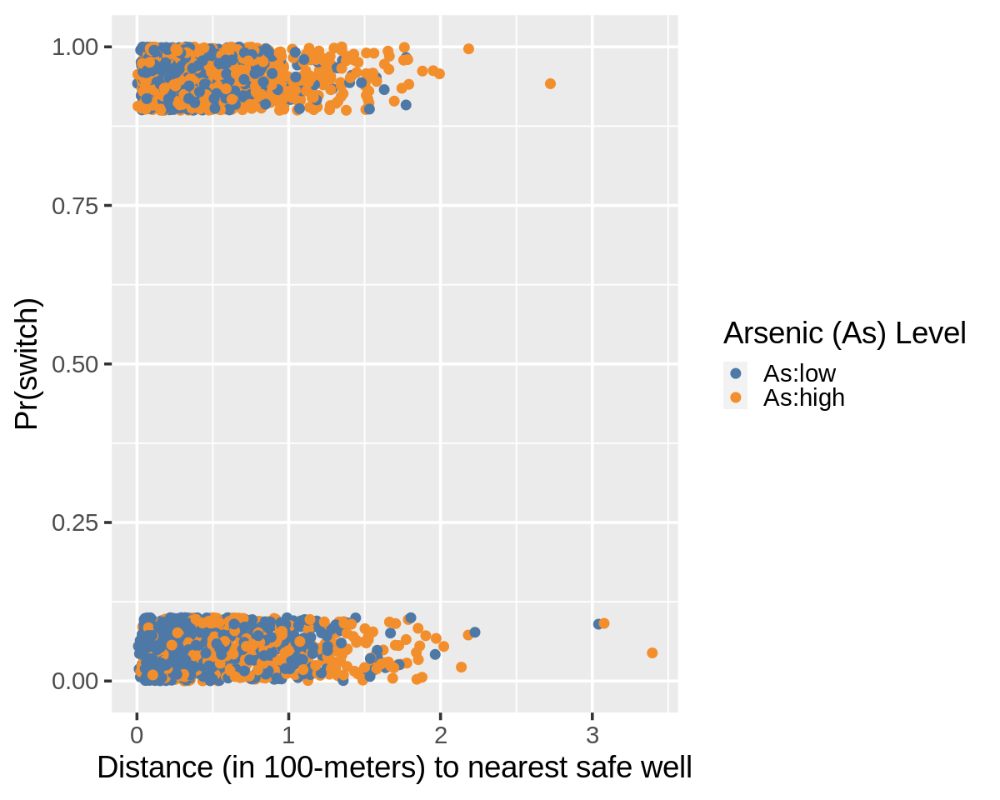

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)

ggplot(wells, aes(x = dist100, y = switch_jitter, colour = factor(arsenic_high))) +
    geom_point(size = 3) +
    scale_color_manual(values = c("#4E79A7", "#F28E2B"),
                       labels = c("As:low", "As:high"),
                       name = "Arsenic (As) Level") +
    labs(x = 'Distance (in 100-meters) to nearest safe well',
         y = 'Pr(switch)') +
    theme_grey(base_size = 22) +
    theme(plot.title = element_text(hjust = 0.5))

## Plot model

In [ ]:
m4 <- brm(switch ~ 1 + dist100 + arsenic,
          data = wells,
          family = bernoulli(link = "logit"),
          seed = 241348,
          refresh=0)

m4

Compiling Stan program...

Start sampling



 Family: bernoulli 
  Links: mu = logit 
Formula: switch ~ 1 + dist100 + arsenic 
   Data: wells (Number of observations: 3020) 
  Draws: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup draws = 4000

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept     0.00      0.08    -0.16     0.16 1.00     5101     3308
dist100      -0.90      0.10    -1.10    -0.70 1.00     3355     2937
arsenic       0.46      0.04     0.38     0.55 1.00     3223     2847

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

## Plot MCMC diagnostics

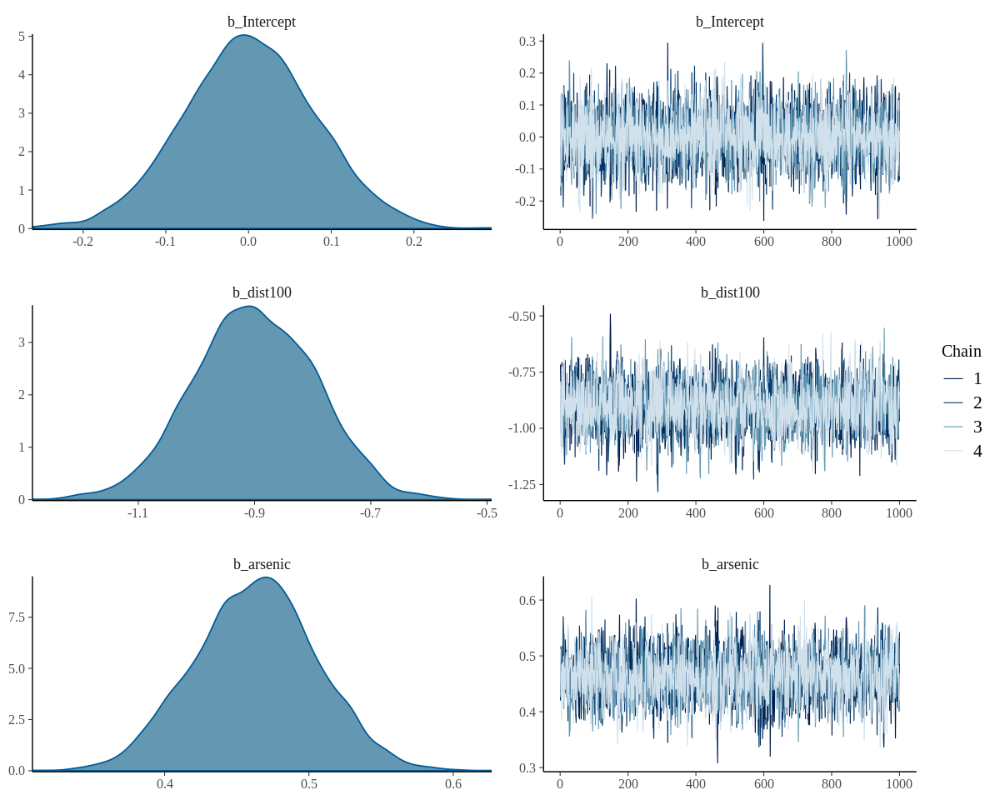

In [ ]:
plot(m4)

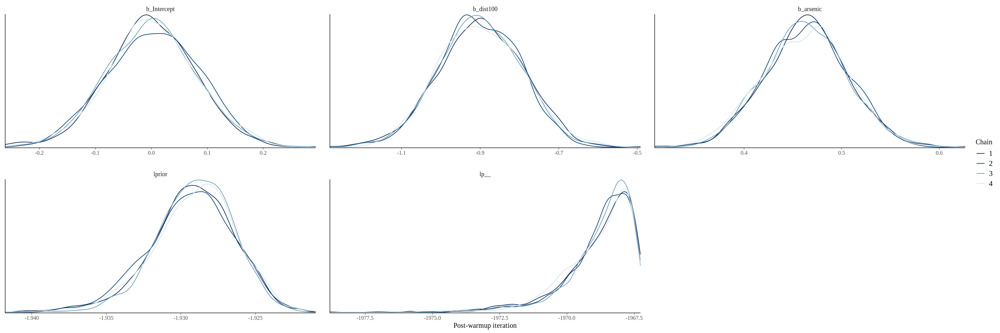

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_dens_overlay(m4) +
  xlab("Post-warmup iteration")

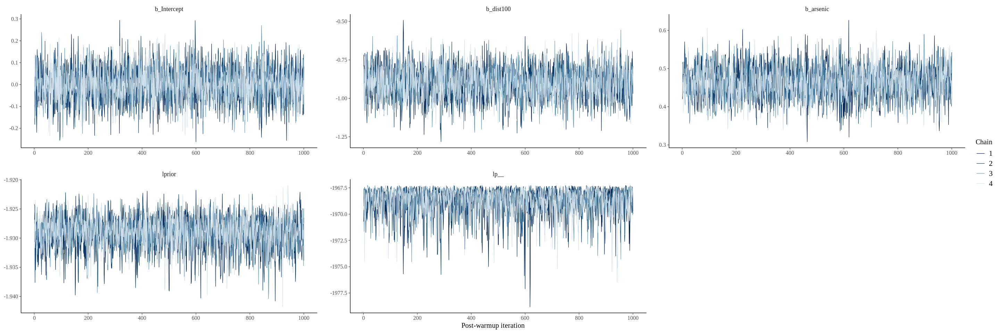

In [ ]:
options(repr.plot.width = 24, repr.plot.height = 8)
mcmc_trace(m4) +
  xlab("Post-warmup iteration")

## Plot posterior distributions

In [ ]:
m4_post <- as.array(m4)
dim(m4_post)

[1] 1000    4    5

In [ ]:
dimnames(m4_post)

In [ ]:
m4_post <- as_draws_df(m4)
head(m4_post)

b_Intercept,b_dist100,b_arsenic,lprior,lp__,.chain,.iteration,.draw
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>
-0.093001432,-0.7161006,0.4200266,-1.924204,-1970.701,1,1,1
-0.141891300,-0.8451681,0.4905837,-1.924515,-1969.685,1,2,2
-0.090741435,-0.7873124,0.4781371,-1.928139,-1968.142,1,3,3
-0.037372978,-0.8900721,0.4848236,-1.929168,-1967.456,1,4,4
-0.009464395,-0.7067189,0.4356449,-1.931792,-1969.557,1,5,5
0.072266526,-1.0303217,0.4640298,-1.929701,-1968.146,1,6,6


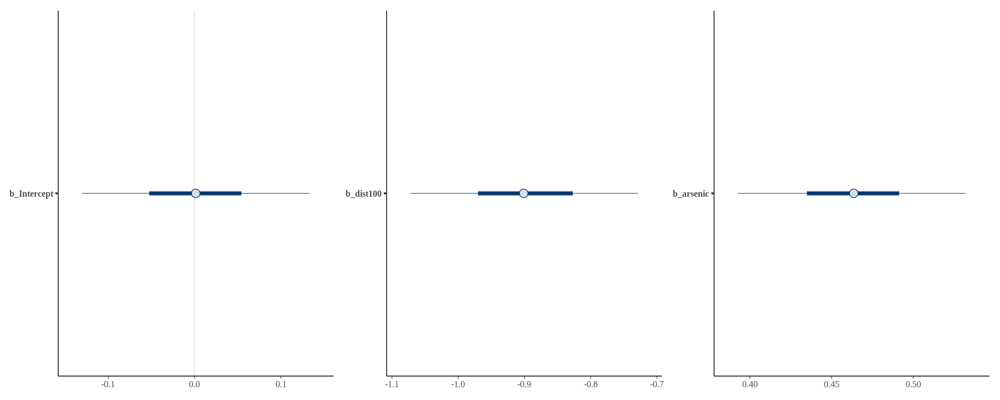

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
g1 <- mcmc_intervals(m4_post, pars = c("b_Intercept"))
g2 <- mcmc_intervals(m4_post, pars = c("b_dist100"))
g3 <- mcmc_intervals(m4_post, pars = c("b_arsenic"))
g1 + g2 + g3

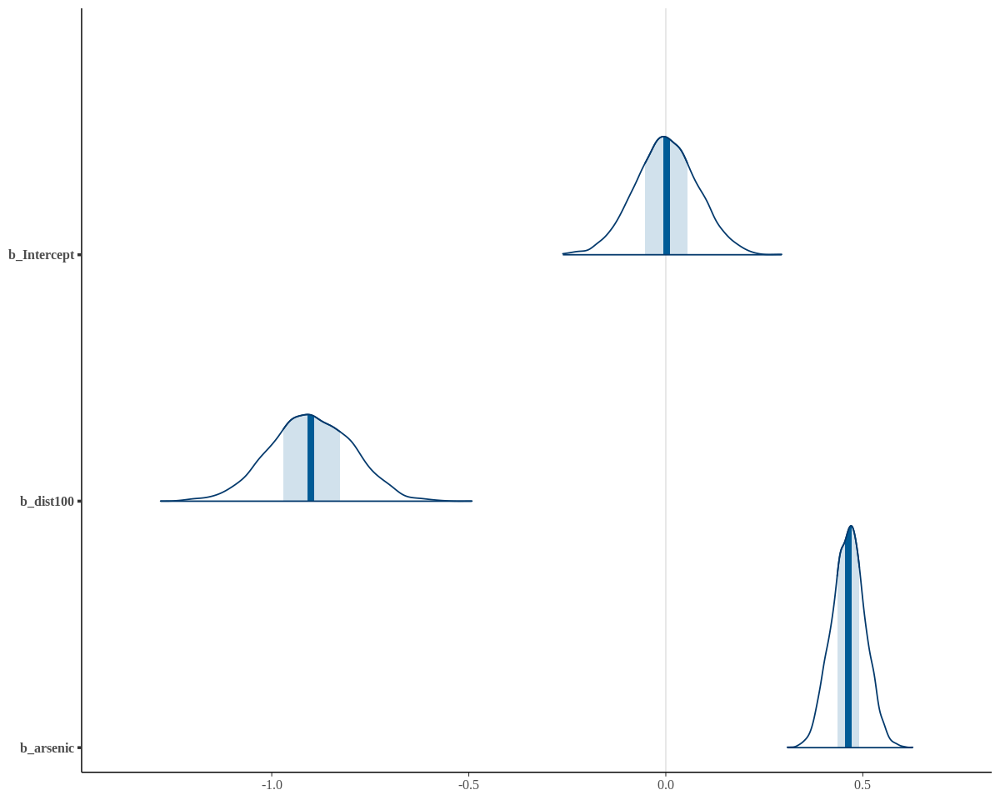

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 8)
mcmc_areas(m4_post, pars = c("b_Intercept", "b_dist100", "b_arsenic"))

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


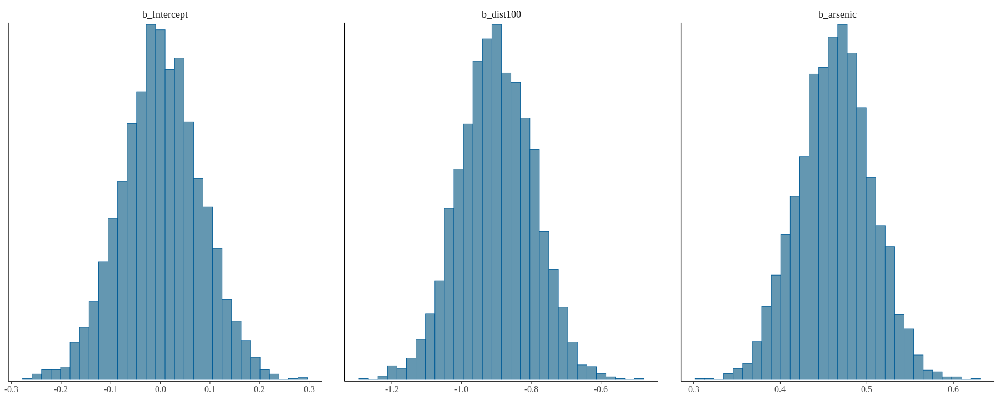

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 6)
mcmc_hist(m4_post, pars = c("b_Intercept", "b_dist100", "b_arsenic"))

## Interpret results

In [ ]:
print(m4)

 Family: bernoulli 
  Links: mu = logit 
Formula: switch ~ 1 + dist100 + arsenic 
   Data: wells (Number of observations: 3020) 
  Draws: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup draws = 4000

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept     0.00      0.08    -0.16     0.16 1.00     5101     3308
dist100      -0.90      0.10    -1.10    -0.70 1.00     3355     2937
arsenic       0.46      0.04     0.38     0.55 1.00     3223     2847

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).


## Plot posterior predictive distributions

Using 10 posterior draws for ppc type 'dens_overlay' by default.



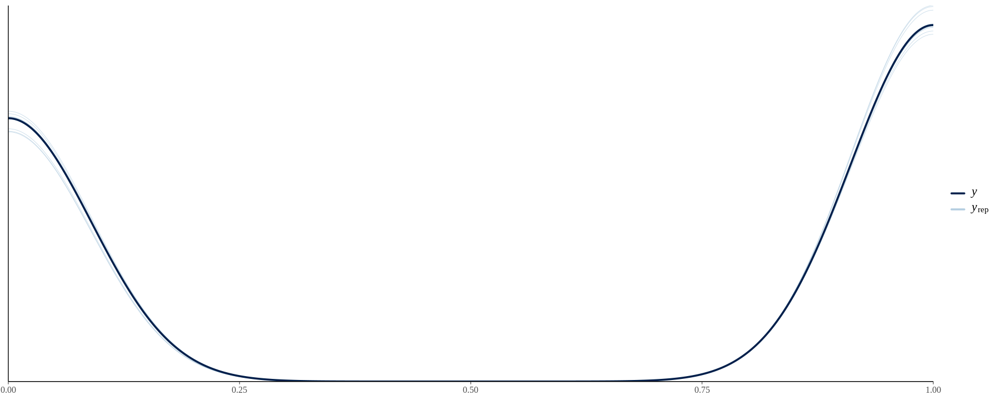

In [ ]:
pp_check(m4)

In [ ]:
y <- wells$switch

In [ ]:
yrep_m4 <- posterior_predict(m4, draws = 500)
dim(yrep_m4)

[1] 4000 3020

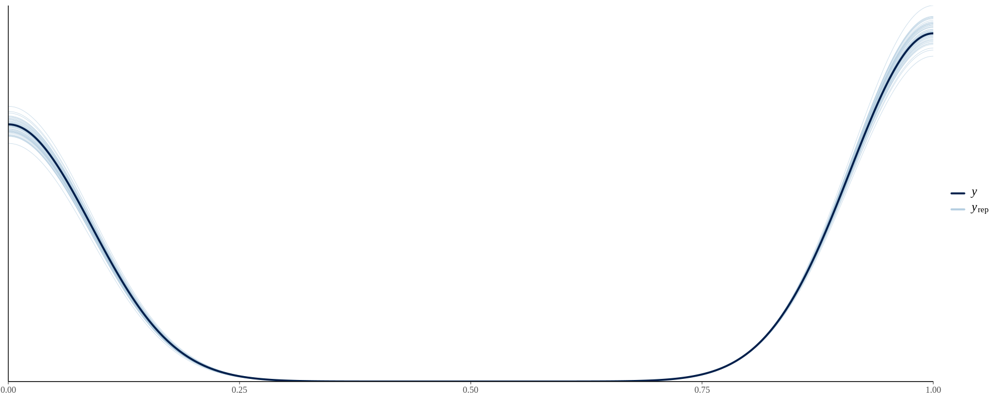

In [ ]:
ppc_dens_overlay(y, yrep_m4[1:50, ])

In [ ]:
loo4 = loo(m4)
loo4


Computed from 4000 by 3020 log-likelihood matrix

         Estimate   SE
elpd_loo  -1968.5 15.7
p_loo         3.3  0.1
looic      3937.0 31.4
------
Monte Carlo SE of elpd_loo is 0.0.

All Pareto k estimates are good (k < 0.5).
See help('pareto-k-diagnostic') for details.

In [ ]:
draws <- as.data.frame(m4)
colnames(draws)[1:3] <- c("a", "dist100", "arsenic")
glimpse(draws)

Rows: 4,000
Columns: 5
$ a       <dbl> -0.0930014315, -0.1418913001, -0.0907414348, -0.0373729776, -0…
$ dist100 <dbl> -0.7161006, -0.8451681, -0.7873124, -0.8900721, -0.7067189, -1…
$ arsenic <dbl> 0.4200266, 0.4905837, 0.4781371, 0.4848236, 0.4356449, 0.46402…
$ lprior  <dbl> -1.924204, -1.924515, -1.928139, -1.929168, -1.931792, -1.9297…
$ lp__    <dbl> -1970.701, -1969.685, -1968.142, -1967.456, -1969.557, -1968.1…


In [ ]:
# SOURCE: https://bookdown.org/content/4857/geocentric-models.html#interpreting-the-posterior-distribution.

logistic_model_m4a <- data.frame(x1 = seq(min(wells$dist100), max(wells$dist100), (max(wells$dist100)-min(wells$dist100))/100),
                                 x2 = seq(min(wells$arsenic), max(wells$arsenic), (max(wells$arsenic)-min(wells$arsenic))/100)) %>%
                         mutate(y1  = fitted(m4, newdata = data.frame(dist100 = x1, arsenic = 1))[,"Estimate"],
                                y05 = fitted(m4, newdata = data.frame(dist100 = x1, arsenic = 0.5))[,"Estimate"]) %>% # brms::fitted
                         rename(dist100 = x1, arsenic = x2, pred_prob1 = y1, pred_prob05 = y05)
head(logistic_model_m4a)

,dist100,arsenic,pred_prob1,pred_prob05
,<dbl>,<dbl>,<dbl>,<dbl>
1,0.0038700,0.5100,0.6131361,0.5570335
2,0.0377844,0.6014,0.6058848,0.5495002
3,0.0716988,0.6928,0.5985850,0.5419429
4,0.1056132,0.7842,0.5912397,0.5343652
5,0.1395276,0.8756,0.5838520,0.5267706
6,0.1734420,0.9670,0.5764252,0.5191628


Warning message:
“Removed 1520 rows containing missing values (`geom_point()`).”


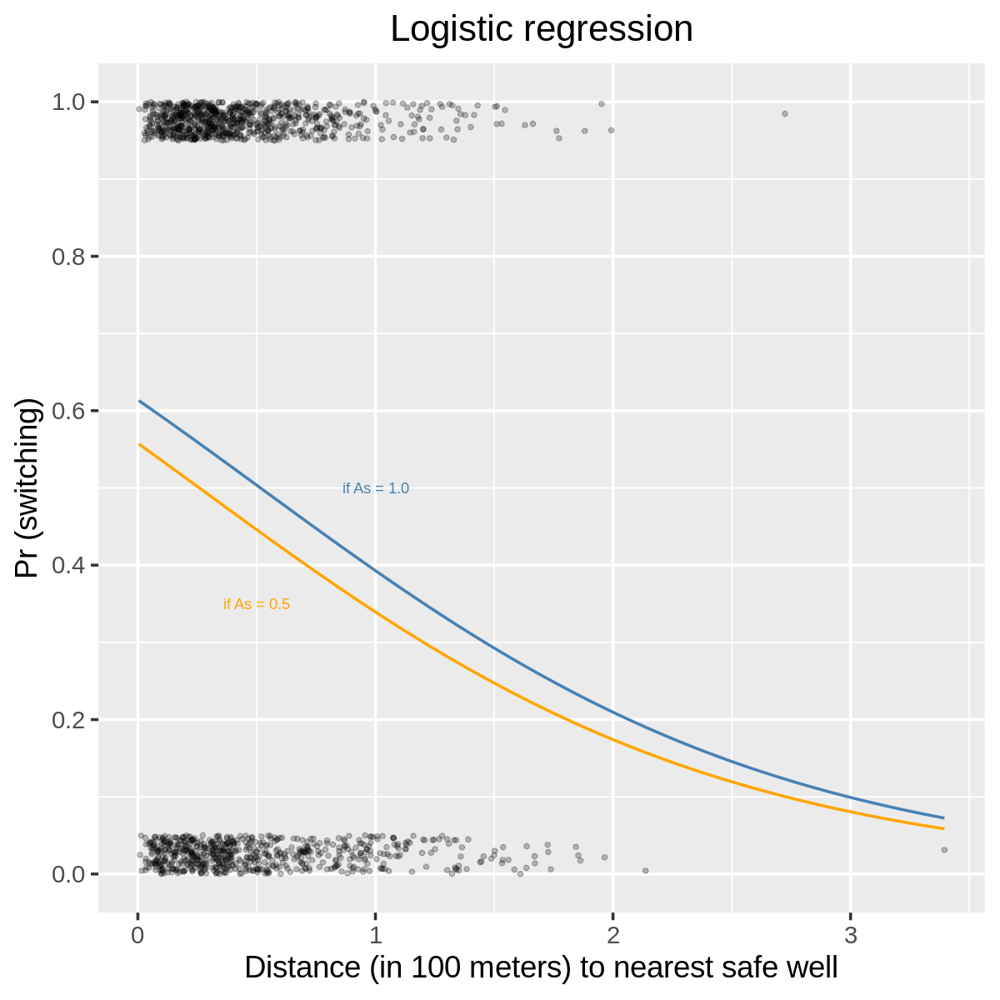

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

# SOURCE: https://bookdown.org/content/4857/geocentric-models.html#interpreting-the-posterior-distribution.
wells %>%
    ggplot(aes(x = dist100, y = switch)) +
    geom_jitter(height = 0.05, alpha = 0.25) +
    geom_line(data = logistic_model_m4a, aes(x = dist100, y = pred_prob1,  colour = "if As = 1.0"), size = 1, linetype = 1) +
    annotate("text", x = 1, y = .5, label = "if As = 1.0", colour = "steelblue") +
    geom_line(data = logistic_model_m4a, aes(x = dist100, y = pred_prob05, colour = "if As = 0.5"), size = 1, linetype = 1) +
    annotate("text", x = .5, y = .35, label = "if As = 0.5", colour = "orange") +
    scale_colour_manual(values = c("orange", "steelblue")) +
    scale_x_continuous(name = "Distance (in 100 meters) to nearest safe well") +
    scale_y_continuous(name = "Pr (switching)",
                      limits = c(0, 1),
                      breaks = seq(0, 1.0, by = 0.2)) +
    ggtitle("Logistic regression") +
    theme_grey(base_size = 22) +
    theme(legend.position = "none",
          plot.title = element_text(hjust = 0.5))

In [ ]:
# SOURCE: https://bookdown.org/content/4857/geocentric-models.html#interpreting-the-posterior-distribution.

logistic_model_m4b <- data.frame(x1 = seq(min(wells$dist100), max(wells$dist100), (max(wells$dist100)-min(wells$dist100))/100),
                                 x2 = seq(min(wells$arsenic), max(wells$arsenic), (max(wells$arsenic)-min(wells$arsenic))/100)) %>%
                         mutate(y1  = fitted(m4, newdata = data.frame(dist100 = 0, arsenic = x2))[,"Estimate"],
                                y05 = fitted(m4, newdata = data.frame(dist100 = 0.5, arsenic = x2))[,"Estimate"]) %>% # brms::fitted
                         rename(dist100 = x1, arsenic = x2, pred_prob1 = y1, pred_prob05 = y05)
head(logistic_model_m4b)

,dist100,arsenic,pred_prob1,pred_prob05
,<dbl>,<dbl>,<dbl>,<dbl>
1,0.0038700,0.5100,0.5590324,0.4471022
2,0.0377844,0.6014,0.5694311,0.4575759
3,0.0716988,0.6928,0.5797694,0.4680891
4,0.1056132,0.7842,0.5900384,0.4786324
5,0.1395276,0.8756,0.6002296,0.4891963
6,0.1734420,0.9670,0.6103347,0.4997709


Warning message:
“Removed 1531 rows containing missing values (`geom_point()`).”


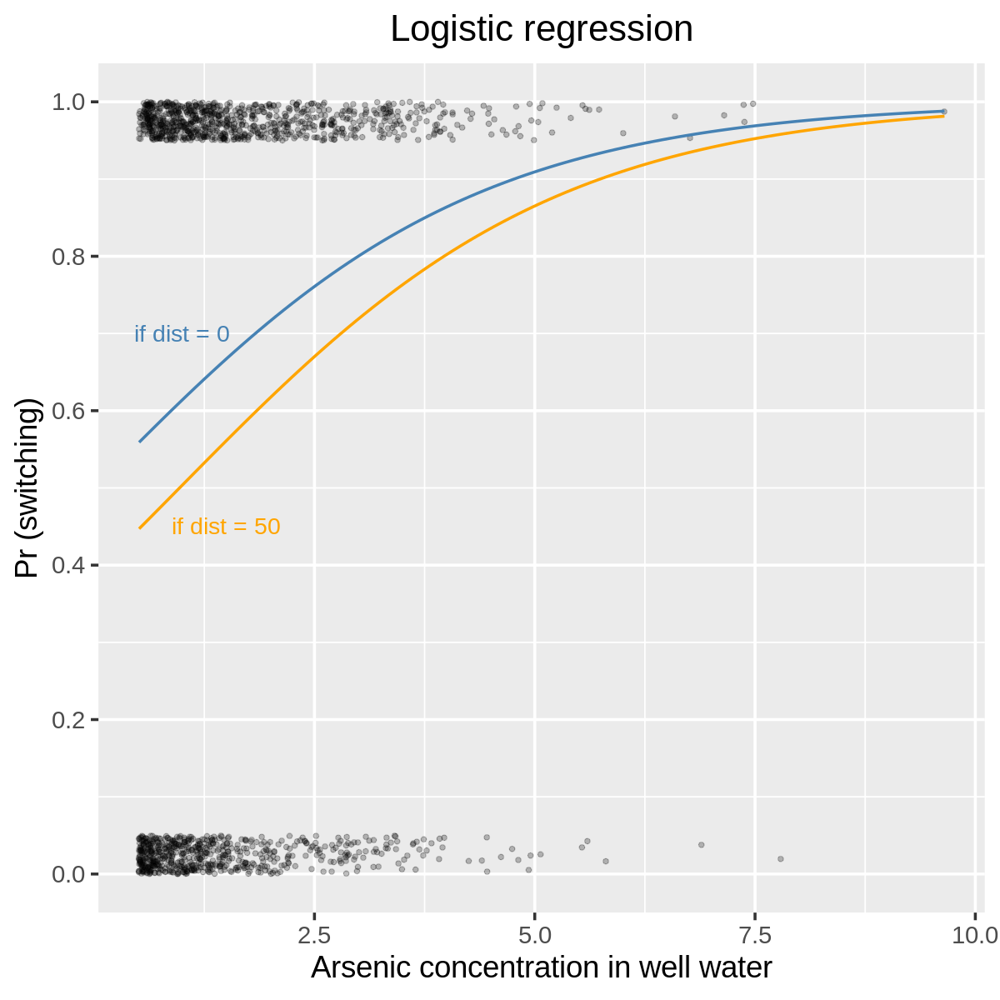

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)

# SOURCE: https://bookdown.org/content/4857/geocentric-models.html#interpreting-the-posterior-distribution.
wells %>%
    ggplot(aes(x = arsenic, y = switch)) +
    geom_jitter(height = 0.05, alpha = 0.25) +
    geom_line(data = logistic_model_m4b, aes(x = arsenic, y = pred_prob1,  colour = "if dist = 0"), size = 1, linetype = 1) +
    annotate("text", x = 1, y = .70, label = "if dist = 0", colour = "steelblue", size = 6) +
    geom_line(data = logistic_model_m4b, aes(x = arsenic, y = pred_prob05, colour = "if dist = 50"), size = 1, linetype = 1) +
    annotate("text", x = 1.5, y = .45, label = "if dist = 50", colour = "orange", size = 6) +
    scale_colour_manual(values = c("steelblue", "orange")) +
    scale_x_continuous(name = "Arsenic concentration in well water") +
    scale_y_continuous(name = "Pr (switching)",
                      limits = c(0, 1),
                      breaks = seq(0, 1.0, by = 0.2)) +
    ggtitle("Logistic regression") +
    theme_grey(base_size = 22) +
    theme(legend.position = "none",
          plot.title = element_text(hjust = 0.5))

---

# Compare models

In [ ]:
comp <- loo_compare(loo1, loo2, loo3, loo4)
print(comp, simplify = FALSE, digits = 2)

   elpd_diff se_diff  elpd_loo se_elpd_loo p_loo    se_p_loo looic    se_looic
m4     0.00      0.00 -1968.51    15.70        3.29     0.14  3937.03    31.40
m2   -52.98     11.96 -2021.49    11.94        1.89     0.02  4042.99    23.87
m3   -71.61     12.20 -2040.13    10.44        2.00     0.05  4080.25    20.88
m1   -91.53     13.65 -2060.04     8.24        0.99     0.01  4120.09    16.49


In [ ]:
print(comp, simplify = TRUE, digits = 1)

   elpd_diff se_diff
m4   0.0       0.0  
m2 -53.0      12.0  
m3 -71.6      12.2  
m1 -91.5      13.6  


---

# Exercise:

### Estimate the relationship between `income as a binary variable (either below or above 50K per year)` and two predictors, `sex` and `hours of work per week`, in a sample of adults from 1994 [[Source]](https://bambinos.github.io/bambi/notebooks/model_comparison.html)

### Read dataset into DataFrame

In [ ]:
d <- read.csv('https://raw.githubusercontent.com/cbrownley/2025ODSCWest/main/data/adults.csv')

### Pre-process data

In [ ]:
d2 <- d %>%
  filter(race %in% c("Black", "White")) %>%
  mutate(income = factor(income),
         sex = factor(sex),
         race = factor(race),
         age_binned = cut(age, breaks=c(17, 25, 35, 45, 65, 90)),
         hs_week_binned = cut(hs_week, breaks=c(0, 20, 40, 60, 100)),
         female = ifelse(sex == "Female", 1, 0)) %>%
  na.omit()

glimpse(d2)

Rows: 30,557
Columns: 8
$ income         <fct> <=50K, <=50K, <=50K, <=50K, <=50K, <=50K, <=50K, >50K, …
$ sex            <fct> Male, Male, Male, Male, Female, Female, Female, Male, F…
$ race           <fct> White, White, White, Black, Black, White, Black, White,…
$ age            <int> 39, 50, 38, 53, 28, 37, 49, 52, 31, 42, 37, 23, 32, 25,…
$ hs_week        <int> 40, 13, 40, 40, 40, 40, 16, 45, 50, 40, 80, 30, 50, 35,…
$ age_binned     <fct> "(35,45]", "(45,65]", "(35,45]", "(45,65]", "(25,35]", …
$ hs_week_binned <fct> "(20,40]", "(0,20]", "(20,40]", "(20,40]", "(20,40]", "…
$ female         <dbl> 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1…


In [ ]:
age_mean <- mean(d2$age)
age_std <- sd(d2$age)

hs_mean <- mean(d2$hs_week)
hs_std <- sd(d2$hs_week)

d2$age <- (d2$age - age_mean) / age_std
d2$hs_week <- (d2$hs_week - hs_mean) / hs_std

glimpse(d2)

Rows: 30,557
Columns: 8
$ income         <fct> <=50K, <=50K, <=50K, <=50K, <=50K, <=50K, <=50K, >50K, …
$ sex            <fct> Male, Male, Male, Male, Female, Female, Female, Male, F…
$ race           <fct> White, White, White, Black, Black, White, Black, White,…
$ age            <dbl> 0.004404307, 0.816030657, -0.069379907, 1.037383298, -0…
$ hs_week        <dbl> -0.05750232, -2.27191889, -0.05750232, -0.05750232, -0.…
$ age_binned     <fct> "(35,45]", "(45,65]", "(35,45]", "(45,65]", "(25,35]", …
$ hs_week_binned <fct> "(20,40]", "(0,20]", "(20,40]", "(20,40]", "(20,40]", "…
$ female         <dbl> 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1…


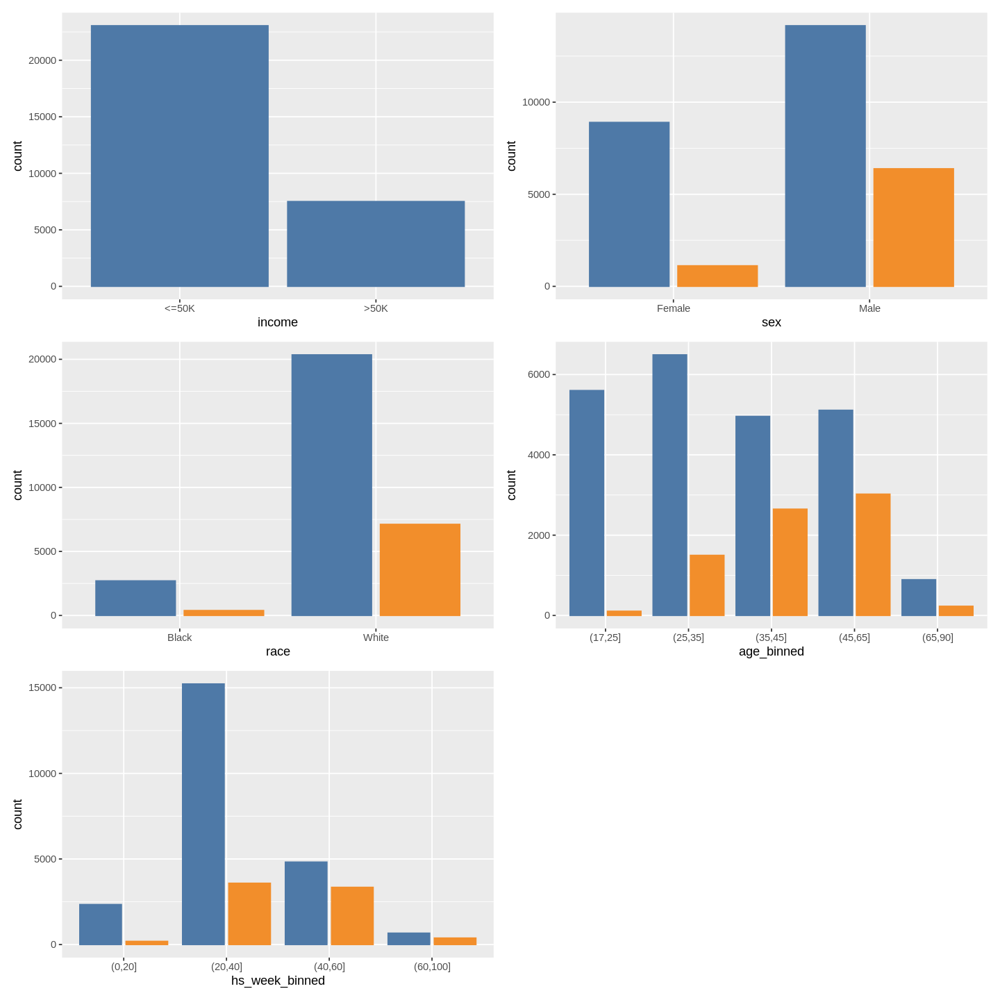

In [ ]:
options(repr.plot.width = 12, repr.plot.height = 12)

p1 <- ggplot(d2, aes(x=income)) +
        geom_bar(color="#4E79A7", fill="#4E79A7") +
        theme(legend.position = "none")

p2 <- ggplot(d2, aes(x=sex, colour=income, fill=income)) +
        geom_bar(position = "dodge2") +
        scale_color_manual(name = "",
                           values = c("#4E79A7", "#F28E2B"),
                           aesthetics = c("colour", "fill")) +
        theme(legend.position = "none")

p3 <- ggplot(d2, aes(x=race, colour=income, fill=income)) +
        geom_bar(position = "dodge2") +
        scale_color_manual(name = "",
                           values = c("#4E79A7", "#F28E2B"),
                           aesthetics = c("colour", "fill")) +
        theme(legend.position = "none")

p4 <- ggplot(d2, aes(x=age_binned, colour=income, fill=income)) +
        geom_bar(position = "dodge2") +
        scale_color_manual(name = "",
                           values = c("#4E79A7", "#F28E2B"),
                           aesthetics = c("colour", "fill")) +
        theme(legend.position = "none")

p5 <- ggplot(d2, aes(x=hs_week_binned, colour=income, fill=income)) +
        geom_bar(position = "dodge2") +
        scale_color_manual(name = "",
                           values = c("#4E79A7", "#F28E2B"),
                           aesthetics = c("colour", "fill")) +
        theme(legend.position = "none")

p1 + p2 + p3 + p4 + p5 +
    plot_layout(ncol = 2, nrow = 3)

### Plot model

In [ ]:
d2$income_gt50k <- ifelse(d2$income == '>50K', 1, 0)

Compiling Stan program...

Start sampling



 Family: bernoulli 
  Links: mu = logit 
Formula: income_gt50k ~ 1 + female + hs_week 
   Data: d2 (Number of observations: 30557) 
  Draws: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup draws = 4000

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept    -0.90      0.02    -0.94    -0.87 1.00     3797     3078
female       -1.09      0.04    -1.16    -1.02 1.00     2993     2391
hs_week       0.47      0.02     0.44     0.49 1.00     3209     2956

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

### Plot prior parameter distributions

prior,class,coef,group,resp,dpar,nlpar,lb,ub,source
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
,b,,,,,,,,default
,b,female,,,,,,,default
,b,hs_week,,,,,,,default
"student_t(3, 0, 2.5)",Intercept,,,,,,,,default


### Fit model

Compiling Stan program...

Start sampling



 Family: bernoulli 
  Links: mu = logit 
Formula: income_gt50k ~ 1 + female + hs_week 
   Data: d2 (Number of observations: 30557) 
  Draws: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup draws = 4000

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept    -0.90      0.02    -0.94    -0.87 1.00     3797     3078
female       -1.09      0.04    -1.16    -1.02 1.00     2993     2391
hs_week       0.47      0.02     0.44     0.49 1.00     3209     2956

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).

### Plot MCMC diagnostics

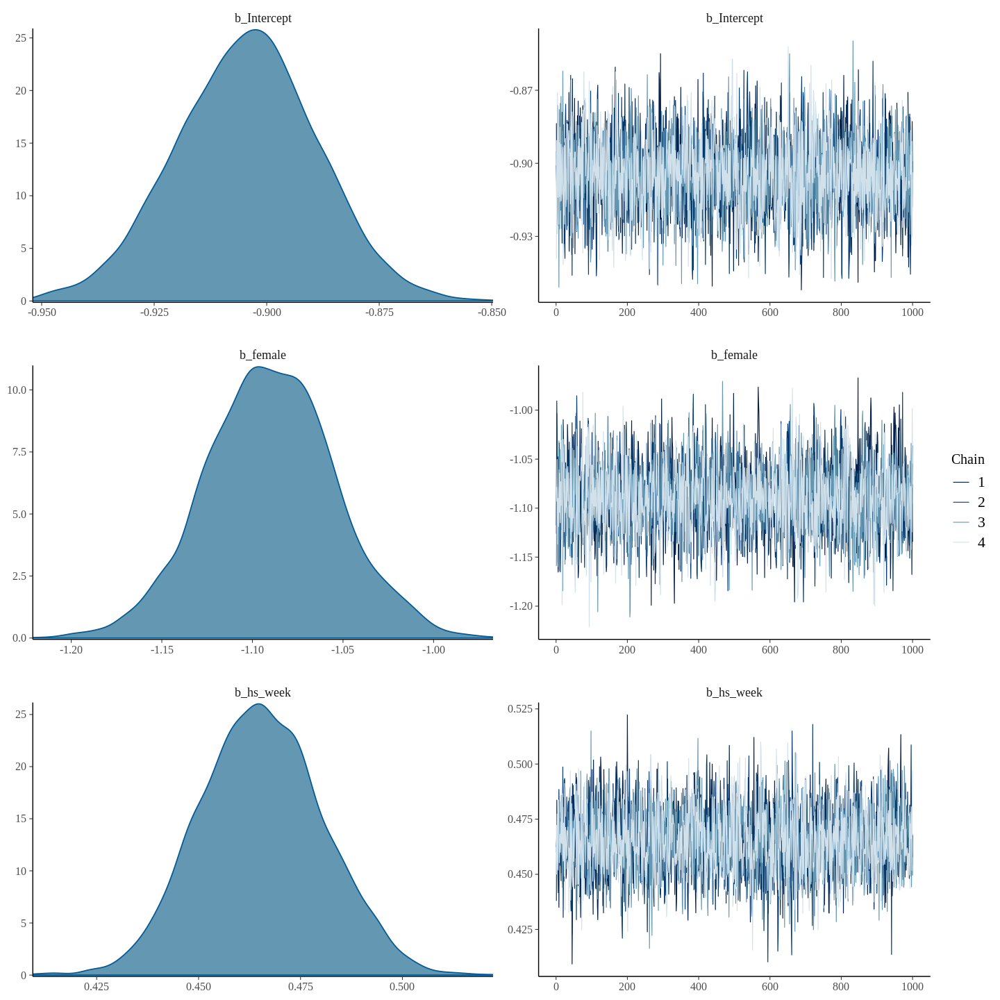

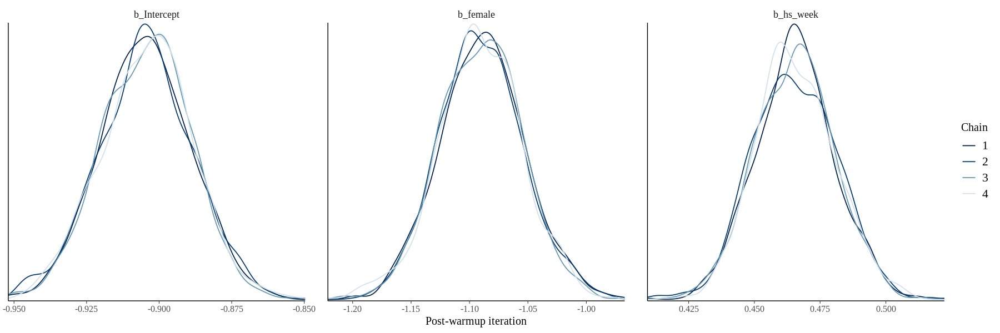

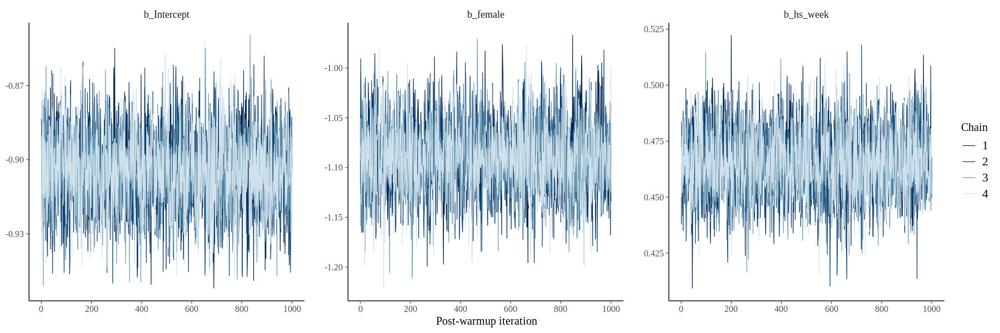

## Plot posterior distributions

[1] 1000    4    5

b_Intercept,b_female,b_hs_week,lprior,lp__,.chain,.iteration,.draw
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>
-0.9008394,-1.117605,0.4623666,-2.081552,-15717.85,1,1,1
-0.9111987,-1.003629,0.4678899,-2.074885,-15720.75,1,2,2
-0.8846164,-1.074313,0.4619267,-2.074054,-15718.90,1,3,3
-0.8979092,-1.063385,0.4667644,-2.076430,-15718.16,1,4,4
-0.9035074,-1.154247,0.4675158,-2.085227,-15719.49,1,5,5
-0.8872789,-1.165261,0.4627667,-2.082067,-15719.73,1,6,6


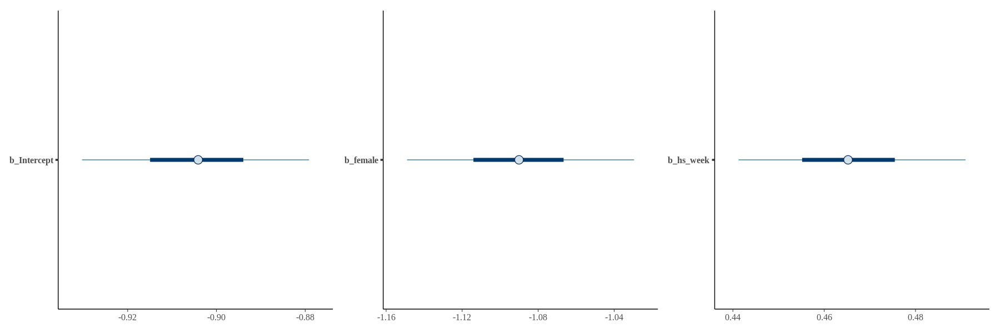

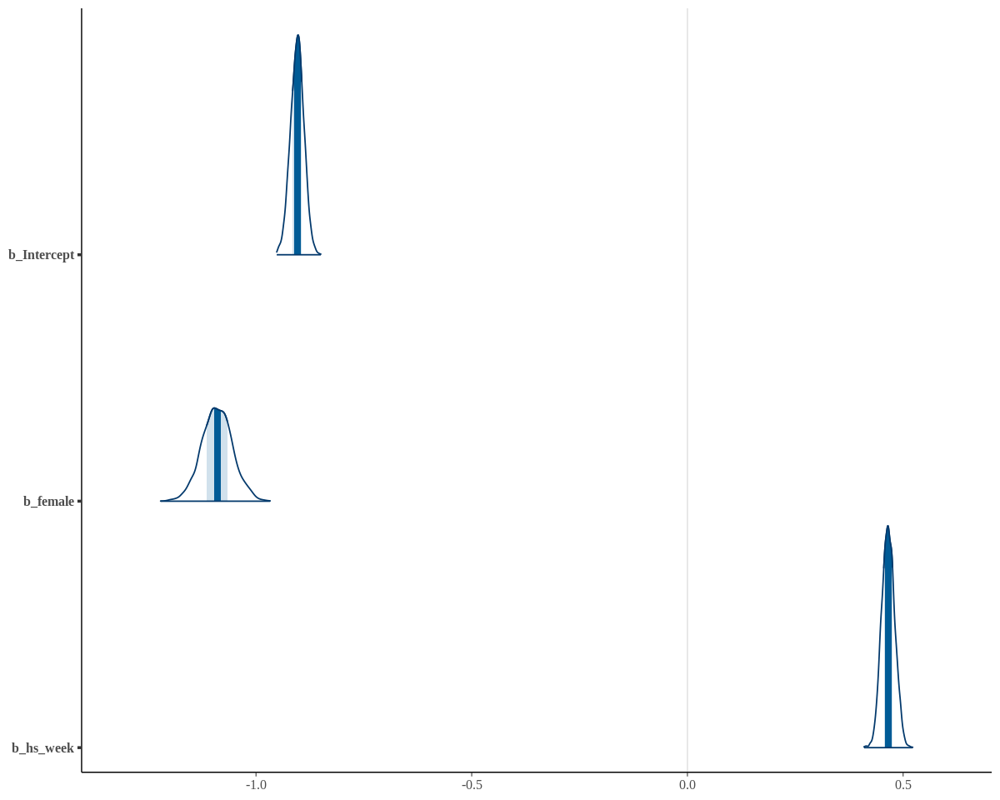

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


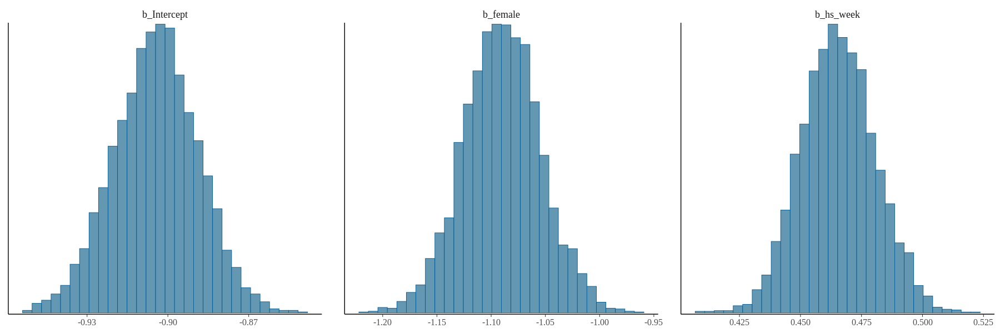

## Interpret results

 Family: bernoulli 
  Links: mu = logit 
Formula: income_gt50k ~ 1 + female + hs_week 
   Data: d2 (Number of observations: 30557) 
  Draws: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup draws = 4000

Population-Level Effects: 
          Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
Intercept    -0.90      0.02    -0.94    -0.87 1.00     3797     3078
female       -1.09      0.04    -1.16    -1.02 1.00     2993     2391
hs_week       0.47      0.02     0.44     0.49 1.00     3209     2956

Draws were sampled using sampling(NUTS). For each parameter, Bulk_ESS
and Tail_ESS are effective sample size measures, and Rhat is the potential
scale reduction factor on split chains (at convergence, Rhat = 1).


## Plot posterior predictive distributions

Using 10 posterior draws for ppc type 'dens_overlay' by default.



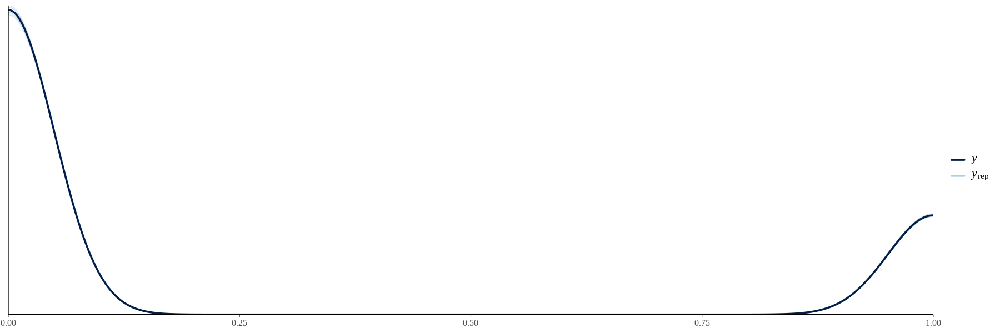

[1]  4000 30557

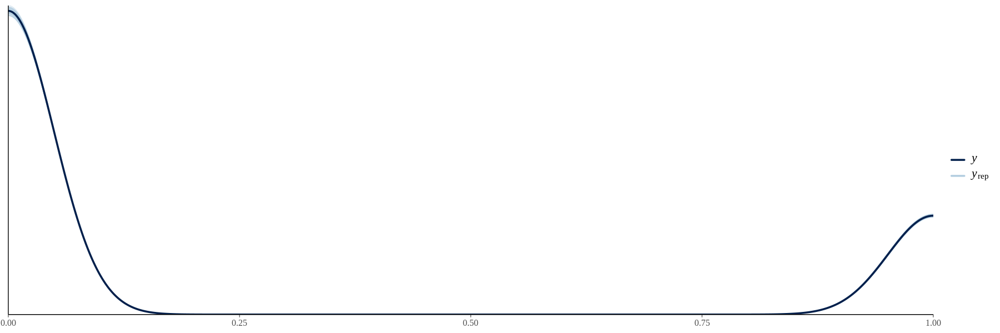


Computed from 4000 by 30557 log-likelihood matrix

         Estimate    SE
elpd_loo -15718.5  89.1
p_loo         3.1   0.0
looic     31437.0 178.1
------
Monte Carlo SE of elpd_loo is 0.0.

All Pareto k estimates are good (k < 0.5).
See help('pareto-k-diagnostic') for details.

---